In [1]:
import numpy as np
import pandas as pd
import pyodbc
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import os

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)

# Tạo connection string với Windows Authentication server 206:
server = '10.16.157.206'
database = 'KHCS'

conn_str_206 = (
    r'DRIVER={SQL Server};'
    rf'SERVER={server};'
    rf'DATABASE={database};'
    r'Trusted_Connection=yes;'
)
# Kết nối tới SQL Server
conn_206 = pyodbc.connect(conn_str_206)

# Tao connection string voi User/Password server 117:
server = '10.16.128.117'
database = 'AMC_RP'
username = 'Rpt_bic_cod_Rcc_R01'
password = 'Rpt@rcc86'
driver = '{ODBC Driver 17 for SQL Server}'
conn_str_117 = f"DRIVER={driver};SERVER={server};DATABASE={database};UID={username};PWD={password}"
conn_117 = pyodbc.connect(conn_str_117)

In [2]:
# get target customer in the last 3M who has DPD>=9 and principle>=1B:
query = r"""
     WITH 
 T7 as (select [CUSTOMER_ID],'2024_07'[YearMonth] FROM [AMC_RP].[dbo].[COLLECTION_MI_20240731] where BIC_SEGMENT not in ('SME', 'MVP') and PRODUCT_GROUP_TL in ('SEC') and max_ovd >= 9 group by [CUSTOMER_ID] having sum(TOTAL_PRINCIPLE) >= 1e9),
 T6 as (select [CUSTOMER_ID],'2024_06'[YearMonth] FROM [AMC_RP].[dbo].[COLLECTION_MI_20240630] where BIC_SEGMENT not in ('SME', 'MVP') and PRODUCT_GROUP_TL in ('SEC') and max_ovd >= 9 group by [CUSTOMER_ID] having sum(TOTAL_PRINCIPLE) >= 1e9),
 T5 as (select [CUSTOMER_ID],'2024_05'[YearMonth] FROM [AMC_RP].[dbo].[COLLECTION_MI_20240531] where BIC_SEGMENT not in ('SME', 'MVP') and PRODUCT_GROUP_TL in ('SEC') and max_ovd >= 9 group by [CUSTOMER_ID] having sum(TOTAL_PRINCIPLE) >= 1e9),
 total as (select * from T7 union select * from T6 union select * from T5)

 select 
   A.[CUSTOMER_ID]
  ,BIC_PRODUCT_GROUP
  ,total.YearMonth
  ,SUM(RESOLVE_AMT_CIF)[TotolResolveAmt]
  ,SUM(UNRESOLVE_AMT_CIF)[TotalUnresolveAmt]
  FROM [AMC_RP].[dbo].[COLLECTION_MI_20240803] A
  left join total on A.CUSTOMER_ID = total.Customer_ID
  where A.[CUSTOMER_ID] in (select [CUSTOMER_ID] from T5 union select [CUSTOMER_ID] from T6 union select [CUSTOMER_ID] from T7)
  group by 
   A.[CUSTOMER_ID]
  ,BIC_PRODUCT_GROUP
  ,total.YearMonth
"""
df = pd.read_sql(query, con=conn_117)
print(df.shape)
df.head()

(27763, 5)


,CUSTOMER_ID,BIC_PRODUCT_GROUP,YearMonth,TotolResolveAmt,TotalUnresolveAmt
0,100038,RB_Household Business,2024_07,6.226340e+08,0.000000e+00
1,10004448,RB_Credit Card,2024_06,0.000000e+00,7.000000e+07
2,10014775,RB_Home Loan,2024_07,1.950000e+09,0.000000e+00
3,10016587,RB_Household Business,2024_07,0.000000e+00,3.008000e+09
4,10028601,RB_Household Business,2024_07,0.000000e+00,3.100000e+09


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27763 entries, 0 to 27762
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CUSTOMER_ID        27763 non-null  object 
 1   BIC_PRODUCT_GROUP  27763 non-null  object 
 2   YearMonth          27763 non-null  object 
 3   TotolResolveAmt    27763 non-null  float64
 4   TotalUnresolveAmt  27763 non-null  float64
dtypes: float64(2), object(3)
memory usage: 1.1+ MB


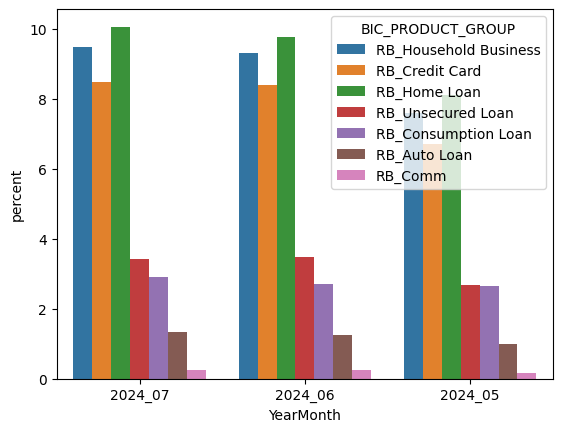

<Figure size 3600x900 with 0 Axes>

In [11]:
sns.countplot(df, hue=df['BIC_PRODUCT_GROUP'], x=df['YearMonth'], stat='percent')
plt.figure(figsize=(36,9))
plt.show()

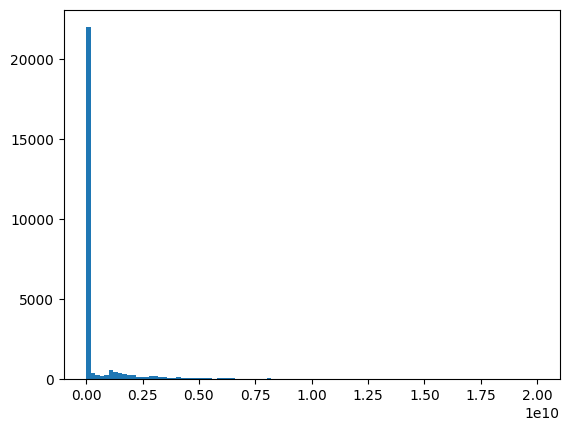

In [17]:
plt.hist(df['TotolResolveAmt'], bins=100)
plt.show()

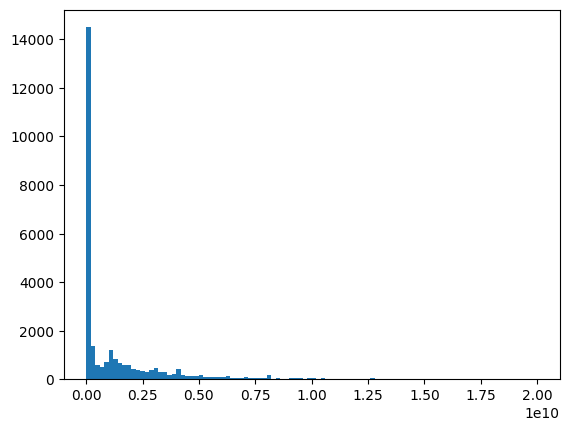

In [15]:
plt.hist(df['TotalUnresolveAmt'], bins=100)
plt.show()

## Get features from EDA team

In [2]:
dfs = []
folder_path = r'D:\AI_project\dataset_collection'

for filename in os.listdir(folder_path):
    if filename.endswith('.parquet'):
        file_path = os.path.join(folder_path, filename)
        df = pd.read_parquet(file_path, engine='pyarrow')
        dfs.append(df)
        
# Gộp tất cả các DataFrame thành một DataFrame duy nhất
df_col = pd.concat(dfs, ignore_index=True)
print(df_col.shape)
df_col.head()

(52823, 3375)


CIF REF_MONTH  LABEL LABEL_MONTH BOM_BUCKET BOM_BUCKET_GROUP  \
0   1000046    202302    1.0      202303        B00              B00   
1  10002240    202306    1.0      202307        B00              B00   
2    100038    202305    1.0      202306        B00              B00   
3  10004448    202403    0.0      202404        B00              B00   
4  10010362    202404    0.0      202405        B00              B00   

  EOM_BUCKET BOM_BUCKET_CIF BOM_BUCKET_CIF_GROUP EOM_BUCKET_CIF BUCKET_FINAL  \
0        B00            B00                  B00            B00          B00   
1        B00            B00                  B00            B00          B00   
2        B00            B00                  B00            B00          B00   
3        B00            B00                  B00            B00          B00   
4        B00            B00                  B00            B00          B00   

  BUCKET_SME_COC NEWRB_BUCKET_GROUP  RST  RPC_LM  UNIQUE_RPC_OTHER  \
0           B01+          B01 daily  NaN     1.0               NaN   
1           B01+          B01 daily  NaN     1.0               NaN   
2           B01+          B01 daily  1.0     1.0               NaN   
3           B01+          B01 daily  NaN     1.0               0.0   
4           B01+               None  NaN     NaN               0.0   

   RESOLVE_LM  FLAG_NEW_UNIQUE_ACTION  FLAG_IVM_NORMAL  FLAG_IVM_INTERACTIVE  \
0         1.0                     1.0              NaN                   NaN   
1         1.0                     1.0              1.0                   1.0   
2         1.0                     1.0              NaN                   NaN   
3         1.0                     1.0              1.0                   NaN   
4         NaN                     NaN              NaN                   NaN   

   FLAG_IVM_TRANSFER  PTP_DUR_MAX  RESOLVE_FINAL  UNIQUE_REFUSE_ACTION  \
0                NaN          1.0            1.0                   0.0   
1                NaN          2.0            1.0                   0.0   
2                NaN          7.0            1.0                   0.0   
3                NaN          3.0            1.0                   0.0   
4                NaN          3.0            1.0                   0.0   

   UNIQUE_BPTP  UNIQUE_KPTP_ACTION  UNIQUE_UNC_ACTION  UNIQUE_ACTION  \
0          1.0                 1.0                0.0            1.0   
1          1.0                 1.0                0.0            1.0   
2          1.0                 1.0                0.0            1.0   
3          1.0                 1.0                0.0            1.0   
4          1.0                 1.0                0.0            1.0   

   UNIQUE_PTP_ACTION  UNIQUE_PTP_FIELD  UNIQUE_PTP_CALL  UNIQUE_TPC_ACTION  \
0                1.0               0.0              1.0                0.0   
1                1.0               1.0              1.0                0.0   
2                1.0               0.0              1.0                0.0   
3                1.0               0.0              1.0                0.0   
4                1.0               0.0              1.0                0.0   

   UNIQUE_RPC_ACTION  UNIQUE_RPC_FIELD  UNIQUE_RPC_CALL  UNIQUE_TRIAL_FIELD  \
0                1.0               0.0              1.0                 0.0   
1                1.0               1.0              1.0                 1.0   
2                1.0               0.0              1.0                 0.0   
3                1.0               0.0              1.0                 0.0   
4                1.0               0.0              1.0                 0.0   

   UNIQUE_TRIAL_CALL_ACTION  UNIQUE_TRIAL_ACTION  UNIQUE_CONTACT_ACTION  \
0                       1.0                  1.0                    1.0   
1                       1.0                  1.0                    1.0   
2                       1.0                  1.0                    1.0   
3                       1.0                  1.0                    1.

* nho loc SEC-UNS theo PRODUCT_MERGE => theo anh Quang thi da co dieu kien SEC roi va khong can loc nua
* phan tich range cho TOTAL_TRIAL_CALL / TOTAL_TRIAL_CALL_NON_IVM / OVD_AMT_CURR / TOTAL_REFUSE_ACTION ? /

In [5]:
pick_col = ['REF_MONTH','LABEL','BPTP_AVG','KPTP_AVG','UNRESOLVE_AMT_CIF','RESOLVE_AMT_CIF','TOD_DPD','NO_OVD_DAYS_MAX','NO_PRODUCT_MERGE','TOTAL_PRINCIPLE','UNIQUE_PTP_ACTION','TOTAL_PTP_ACTION_MAX']
exclude = ['TOD_DPD']

cols = []
for col in df_col.columns:
    if 'CASA' in col:
        cols.append(col)
cols = cols + pick_col
cols = [item for item in cols if item not in exclude]
len(cols)
print(cols)

['CASA_TXN_AMT_TRANSFER_OUT_COUNT_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_AVG_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_MIN_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_MAX_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_STD_L1M', 'CASA_TXN_AMT_TRANSFER_OUT_COUNT_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_SUM_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_AVG_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_MAX_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_STD_L3M', 'CASA_TXN_AMT_TRANSFER_OUT_COUNT_L6M', 'CASA_TXN_AMT_TRANSFER_OUT_SUM_L6M', 'CASA_TXN_AMT_TRANSFER_OUT_AVG_L6M', 'CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L6M', 'CASA_TXN_AMT_TRANSFER_OUT_MIN_L6M', 'CASA_TXN_AMT_TRANSFER_OUT_MAX_L6M', 'CASA_TXN_AMT_TRANSFER_OUT_STD_L6M', 'CASA_BAL_AVG_L1M_DLY', 'CASA_BAL_MEDIAN_L1M_DLY', 'CASA_BAL_MIN_L1M_DLY', 'CASA_BAL_MAX_L1M_DLY', 'CASA_BAL_STD_L1M_DLY', 'CASA_NUM_AVG_L1M_DLY', 'CASA_NUM_MEDIAN_L1M_DLY', 'CASA_NUM_MIN_L1M_DLY', 'CASA_NUM

In [11]:
pivot = df_col[['REF_MONTH','LABEL']].pivot_table(index='REF_MONTH', columns='LABEL', aggfunc='size')
pivot

LABEL,0.0,1.0
REF_MONTH,,
202301,1497,824
202302,1637,814
202303,1598,911
202304,1295,982
202305,1364,1014
202306,1533,1065
202307,1705,1133
202308,1528,1358
202309,1729,1321


##### Model 1: Only some pickup cols

In [6]:
df1 = df_col[df_col['PRODUCT_MERGE']=='SECURED'][cols]
print(df1.shape)
df1.head()

(31883, 268)


,CASA_TXN_AMT_TRANSFER_OUT_COUNT_L1M,CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M,CASA_TXN_AMT_TRANSFER_OUT_AVG_L1M,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L1M,CASA_TXN_AMT_TRANSFER_OUT_MIN_L1M,CASA_TXN_AMT_TRANSFER_OUT_MAX_L1M,CASA_TXN_AMT_TRANSFER_OUT_STD_L1M,CASA_TXN_AMT_TRANSFER_OUT_COUNT_L3M,CASA_TXN_AMT_TRANSFER_OUT_SUM_L3M,CASA_TXN_AMT_TRANSFER_OUT_AVG_L3M,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L3M,CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M,CASA_TXN_AMT_TRANSFER_OUT_MAX_L3M,CASA_TXN_AMT_TRANSFER_OUT_STD_L3M,CASA_TXN_AMT_TRANSFER_OUT_COUNT_L6M,CASA_TXN_AMT_TRANSFER_OUT_SUM_L6M,CASA_TXN_AMT_TRANSFER_OUT_AVG_L6M,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L6M,CASA_TXN_AMT_TRANSFER_OUT_MIN_L6M,CASA_TXN_AMT_TRANSFER_OUT_MAX_L6M,CASA_TXN_AMT_TRANSFER_OUT_STD_L6M,CASA_BAL_AVG_L1M_DLY,CASA_BAL_MEDIAN_L1M_DLY,CASA_BAL_MIN_L1M_DLY,CASA_BAL_MAX_L1M_DLY,CASA_BAL_STD_L1M_DLY,CASA_NUM_AVG_L1M_DLY,CASA_NUM_MEDIAN_L1M_DLY,CASA_NUM_MIN_L1M_DLY,CASA_NUM_MAX_L1M_DLY,CASA_NUM_STD_L1M_DLY,CASA_BAL_AVG_L3M_DLY,CASA_BAL_MEDIAN_L3M_DLY,CASA_BAL_MIN_L3M_DLY,CASA_BAL_MAX_L3M_DLY,CASA_BAL_STD_L3M_DLY,CASA_NUM_AVG_L3M_DLY,CASA_NUM_MEDIAN_L3M_DLY,CASA_NUM_MIN_L3M_DLY,CASA_NUM_MAX_L3M_DLY,CASA_NUM_STD_L3M_DLY,CASA_PAYROLL_AMOUNT_MIN_L1M_MLY,CASA_PAYROLL_AMOUNT_MAX_L1M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L1M_MLY,CASA_PAYROLL_AMOUNT_AVG_L1M_MLY,CASA_PAYROLL_AMOUNT_MIN_L3M_MLY,CASA_PAYROLL_AMOUNT_MAX_L3M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L3M_MLY,CASA_PAYROLL_AMOUNT_AVG_L3M_MLY,CASA_PAYROLL_AMOUNT_MIN_L6M_MLY,CASA_PAYROLL_AMOUNT_MAX_L6M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L6M_MLY,CASA_PAYROLL_AMOUNT_AVG_L6M_MLY,CASA_PAYROLL_AMOUNT_MIN_L12M_MLY,CASA_PAYROLL_AMOUNT_MAX_L12M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L12M_MLY,CASA_PAYROLL_AMOUNT_AVG_L12M_MLY,CASA_PAYROLL_PAYDATE_MEDIAN_L12M_MLY,CASA_TXN_DAYSSINCE_LASTTXN,CASA_BAL_ABS_GROWTH_L1M_MLY,CASA_BAL_REL_GROWTH_L1M_MLY,CASA_BAL_ABS_GROWTH_L3M_MLY,CASA_BAL_REL_GROWTH_L3M_MLY,CASA_BAL_ABS_GROWTH_L6M_MLY,CASA_BAL_REL_GROWTH_L6M_MLY,CASA_TXN_AMT_ATM_OUT_COUNT_L1M,CASA_TXN_AMT_ATM_OUT_SUM_L1M,CASA_TXN_AMT_ATM_OUT_AVG_L1M,CASA_TXN_AMT_ATM_OUT_MEDIAN_L1M,CASA_TXN_AMT_ATM_OUT_MIN_L1M,CASA_TXN_AMT_ATM_OUT_MAX_L1M,CASA_TXN_AMT_ATM_OUT_STD_L1M,CASA_TXN_AMT_ATM_OUT_COUNT_L3M,CASA_TXN_AMT_ATM_OUT_SUM_L3M,CASA_TXN_AMT_ATM_OUT_AVG_L3M,CASA_TXN_AMT_ATM_OUT_MEDIAN_L3M,CASA_TXN_AMT_ATM_OUT_MIN_L3M,CASA_TXN_AMT_ATM_OUT_MAX_L3M,CASA_TXN_AMT_ATM_OUT_STD_L3M,CASA_TXN_AMT_ATM_OUT_COUNT_L6M,CASA_TXN_AMT_ATM_OUT_SUM_L6M,CASA_TXN_AMT_ATM_OUT_AVG_L6M,CASA_TXN_AMT_ATM_OUT_MEDIAN_L6M,CASA_TXN_AMT_ATM_OUT_MIN_L6M,CASA_TXN_AMT_ATM_OUT_MAX_L6M,CASA_TXN_AMT_ATM_OUT_STD_L6M,CASA_TXN_AMT_ATM_IN_COUNT_L1M,CASA_TXN_AMT_ATM_IN_SUM_L1M,CASA_TXN_AMT_ATM_IN_AVG_L1M,CASA_TXN_AMT_ATM_IN_MEDIAN_L1M,CASA_TXN_AMT_ATM_IN_MIN_L1M,CASA_TXN_AMT_ATM_IN_MAX_L1M,CASA_TXN_AMT_ATM_IN_STD_L1M,CASA_TXN_AMT_ATM_IN_COUNT_L3M,CASA_TXN_AMT_ATM_IN_SUM_L3M,CASA_TXN_AMT_ATM_IN_AVG_L3M,CASA_TXN_AMT_ATM_IN_MEDIAN_L3M,CASA_TXN_AMT_ATM_IN_MIN_L3M,CASA_TXN_AMT_ATM_IN_MAX_L3M,CASA_TXN_AMT_ATM_IN_STD_L3M,CASA_TXN_AMT_ATM_IN_COUNT_L6M,CASA_TXN_AMT_ATM_IN_SUM_L6M,CASA_TXN_AMT_ATM_IN_AVG_L6M,CASA_TXN_AMT_ATM_IN_MEDIAN_L6M,CASA_TXN_AMT_ATM_IN_MIN_L6M,CASA_TXN_AMT_ATM_IN_MAX_L6M,CASA_TXN_AMT_ATM_IN_STD_L6M,CASA_TXN_AMT_COUNTER_OUT_COUNT_L1M,CASA_TXN_AMT_COUNTER_OUT_SUM_L1M,CASA_TXN_AMT_COUNTER_OUT_AVG_L1M,CASA_TXN_AMT_COUNTER_OUT_MEDIAN_L1M,CASA_TXN_AMT_COUNTER_OUT_MIN_L1M,CASA_TXN_AMT_COUNTER_OUT_MAX_L1M,CASA_TXN_AMT_COUNTER_OUT_STD_L1M,CASA_TXN_AMT_COUNTER_OUT_COUNT_L3M,CASA_TXN_AMT_COUNTER_OUT_SUM_L3M,CASA_TXN_AMT_COUNTER_OUT_AVG_L3M,CASA_TXN_AMT_COUNTER_OUT_MEDIAN_L3M,CASA_TXN_AMT_COUNTER_OUT_MIN_L3M,CASA_TXN_AMT_COUNTER_OUT_MAX_L3M,CASA_TXN_AMT_COUNTER_OUT_STD_L3M,CASA_TXN_AMT_COUNTER_OUT_COUNT_L6M,CASA_TXN_AMT_COUNTER_OUT_SUM_L6M,CASA_TXN_AMT_COUNTER_OUT_AVG_L6M,CASA_TXN_AMT_COUNTER_OUT_MEDIAN_L6M,CASA_TXN_AMT_COUNTER_OUT_MIN_L6M,CASA_TXN_AMT_COUNTER_OUT_MAX_L6M,CASA_TXN_AMT_COUNTER_OUT_STD_L6M,CASA_TXN_AMT_COUNTER_IN_COUNT_L1M,CASA_TXN_AMT_COUNTER_IN_SUM_L1M,CASA_TXN_AMT_COUNTER_IN_AVG_L1M,CASA_TXN_AMT_COUNTER_IN_MEDIAN_L1M,CASA_TXN_A

In [35]:
df1.describe()

,CASA_TXN_AMT_TRANSFER_OUT_COUNT_L1M,CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M,CASA_TXN_AMT_TRANSFER_OUT_AVG_L1M,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L1M,CASA_TXN_AMT_TRANSFER_OUT_MIN_L1M,CASA_TXN_AMT_TRANSFER_OUT_MAX_L1M,CASA_TXN_AMT_TRANSFER_OUT_STD_L1M,CASA_TXN_AMT_TRANSFER_OUT_COUNT_L3M,CASA_TXN_AMT_TRANSFER_OUT_SUM_L3M,CASA_TXN_AMT_TRANSFER_OUT_AVG_L3M,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L3M,CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M,CASA_TXN_AMT_TRANSFER_OUT_MAX_L3M,CASA_TXN_AMT_TRANSFER_OUT_STD_L3M,CASA_TXN_AMT_TRANSFER_OUT_COUNT_L6M,CASA_TXN_AMT_TRANSFER_OUT_SUM_L6M,CASA_TXN_AMT_TRANSFER_OUT_AVG_L6M,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L6M,CASA_TXN_AMT_TRANSFER_OUT_MIN_L6M,CASA_TXN_AMT_TRANSFER_OUT_MAX_L6M,CASA_TXN_AMT_TRANSFER_OUT_STD_L6M,CASA_BAL_MEDIAN_L1M_DLY,CASA_BAL_STD_L1M_DLY,CASA_NUM_AVG_L1M_DLY,CASA_NUM_MEDIAN_L1M_DLY,CASA_NUM_MIN_L1M_DLY,CASA_NUM_MAX_L1M_DLY,CASA_NUM_STD_L1M_DLY,CASA_BAL_MEDIAN_L3M_DLY,CASA_BAL_STD_L3M_DLY,CASA_NUM_AVG_L3M_DLY,CASA_NUM_MEDIAN_L3M_DLY,CASA_NUM_MIN_L3M_DLY,CASA_NUM_MAX_L3M_DLY,CASA_NUM_STD_L3M_DLY,CASA_PAYROLL_AMOUNT_MIN_L1M_MLY,CASA_PAYROLL_AMOUNT_MAX_L1M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L1M_MLY,CASA_PAYROLL_AMOUNT_AVG_L1M_MLY,CASA_PAYROLL_AMOUNT_MIN_L3M_MLY,CASA_PAYROLL_AMOUNT_MAX_L3M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L3M_MLY,CASA_PAYROLL_AMOUNT_AVG_L3M_MLY,CASA_PAYROLL_AMOUNT_MIN_L6M_MLY,CASA_PAYROLL_AMOUNT_MAX_L6M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L6M_MLY,CASA_PAYROLL_AMOUNT_AVG_L6M_MLY,CASA_PAYROLL_AMOUNT_MIN_L12M_MLY,CASA_PAYROLL_AMOUNT_MAX_L12M_MLY,CASA_PAYROLL_AMOUNT_MEDIAN_L12M_MLY,CASA_PAYROLL_AMOUNT_AVG_L12M_MLY,CASA_PAYROLL_PAYDATE_MEDIAN_L12M_MLY,CASA_TXN_DAYSSINCE_LASTTXN,CASA_TXN_AMT_ATM_OUT_COUNT_L1M,CASA_TXN_AMT_ATM_OUT_SUM_L1M,CASA_TXN_AMT_ATM_OUT_AVG_L1M,CASA_TXN_AMT_ATM_OUT_MEDIAN_L1M,CASA_TXN_AMT_ATM_OUT_MIN_L1M,CASA_TXN_AMT_ATM_OUT_MAX_L1M,CASA_TXN_AMT_ATM_OUT_STD_L1M,CASA_TXN_AMT_ATM_OUT_COUNT_L3M,CASA_TXN_AMT_ATM_OUT_SUM_L3M,CASA_TXN_AMT_ATM_OUT_AVG_L3M,CASA_TXN_AMT_ATM_OUT_MEDIAN_L3M,CASA_TXN_AMT_ATM_OUT_MIN_L3M,CASA_TXN_AMT_ATM_OUT_MAX_L3M,CASA_TXN_AMT_ATM_OUT_STD_L3M,CASA_TXN_AMT_ATM_OUT_COUNT_L6M,CASA_TXN_AMT_ATM_OUT_SUM_L6M,CASA_TXN_AMT_ATM_OUT_AVG_L6M,CASA_TXN_AMT_ATM_OUT_MEDIAN_L6M,CASA_TXN_AMT_ATM_OUT_MIN_L6M,CASA_TXN_AMT_ATM_OUT_MAX_L6M,CASA_TXN_AMT_ATM_OUT_STD_L6M,CASA_TXN_AMT_ATM_IN_COUNT_L1M,CASA_TXN_AMT_ATM_IN_SUM_L1M,CASA_TXN_AMT_ATM_IN_AVG_L1M,CASA_TXN_AMT_ATM_IN_MEDIAN_L1M,CASA_TXN_AMT_ATM_IN_MIN_L1M,CASA_TXN_AMT_ATM_IN_MAX_L1M,CASA_TXN_AMT_ATM_IN_STD_L1M,CASA_TXN_AMT_ATM_IN_COUNT_L3M,CASA_TXN_AMT_ATM_IN_SUM_L3M,CASA_TXN_AMT_ATM_IN_AVG_L3M,CASA_TXN_AMT_ATM_IN_MEDIAN_L3M,CASA_TXN_AMT_ATM_IN_MIN_L3M,CASA_TXN_AMT_ATM_IN_MAX_L3M,CASA_TXN_AMT_ATM_IN_STD_L3M,CASA_TXN_AMT_ATM_IN_COUNT_L6M,CASA_TXN_AMT_ATM_IN_SUM_L6M,CASA_TXN_AMT_ATM_IN_AVG_L6M,CASA_TXN_AMT_ATM_IN_MEDIAN_L6M,CASA_TXN_AMT_ATM_IN_MIN_L6M,CASA_TXN_AMT_ATM_IN_MAX_L6M,CASA_TXN_AMT_ATM_IN_STD_L6M,CASA_TXN_AMT_COUNTER_OUT_COUNT_L1M,CASA_TXN_AMT_COUNTER_OUT_SUM_L1M,CASA_TXN_AMT_COUNTER_OUT_AVG_L1M,CASA_TXN_AMT_COUNTER_OUT_MEDIAN_L1M,CASA_TXN_AMT_COUNTER_OUT_MIN_L1M,CASA_TXN_AMT_COUNTER_OUT_MAX_L1M,CASA_TXN_AMT_COUNTER_OUT_STD_L1M,CASA_TXN_AMT_COUNTER_OUT_COUNT_L3M,CASA_TXN_AMT_COUNTER_OUT_SUM_L3M,CASA_TXN_AMT_COUNTER_OUT_AVG_L3M,CASA_TXN_AMT_COUNTER_OUT_MEDIAN_L3M,CASA_TXN_AMT_COUNTER_OUT_MIN_L3M,CASA_TXN_AMT_COUNTER_OUT_MAX_L3M,CASA_TXN_AMT_COUNTER_OUT_STD_L3M,CASA_TXN_AMT_COUNTER_OUT_COUNT_L6M,CASA_TXN_AMT_COUNTER_OUT_SUM_L6M,CASA_TXN_AMT_COUNTER_OUT_AVG_L6M,CASA_TXN_AMT_COUNTER_OUT_MEDIAN_L6M,CASA_TXN_AMT_COUNTER_OUT_MIN_L6M,CASA_TXN_AMT_COUNTER_OUT_MAX_L6M,CASA_TXN_AMT_COUNTER_OUT_STD_L6M,CASA_TXN_AMT_COUNTER_IN_COUNT_L1M,CASA_TXN_AMT_COUNTER_IN_SUM_L1M,CASA_TXN_AMT_COUNTER_IN_AVG_L1M,CASA_TXN_AMT_COUNTER_IN_MEDIAN_L1M,CASA_TXN_AMT_COUNTER_IN_MIN_L1M,CASA_TXN_AMT_COUNTER_IN_MAX_L1M,CASA_TXN_AMT_COUNTER_IN_STD_L1M,CASA_TXN_AMT_COUNTER_IN_COUNT_L3M,CASA_TXN_AMT_COUNTER_IN_SUM_L3M,CASA_TXN_AMT_COUNTER_IN_AVG_L3M,CASA_TXN_AMT_COUNTER_IN_MEDIAN_L3M,CASA_TXN_AMT_COUNTER_IN_MIN_L3M,CASA_TXN_AMT_COUNTER_IN_MAX_L3M,CASA_TXN_AM

In [7]:
df1['LABEL'].isnull().sum()

0

In [8]:
# fill NAN values:
for col in df1.columns:
    if df1[col].isnull().sum() > 0:
        df1[col] = df1[col].fillna(df1[col].mean())


In [9]:
# check if there are still NAN columns:
col_nan = []
while col in df1.columns and df1[col].isnull().sum() != 0:
    col_nan.append(col)
    print(col_nan)
else:
    print('No null values remain. You are good to go!')


No null values remain. You are good to go!


In [10]:
df1['LABEL'].value_counts()

LABEL
0.0    20268
1.0    11615
Name: count, dtype: int64

In [11]:
# assign X - y:
y = df1['LABEL']
X = df1.drop(columns=['LABEL'])

y_test = df1[df1['REF_MONTH'].isin(['202405','202405'])]['LABEL']
y_train = df1[~df1['REF_MONTH'].isin(['202405','202405'])]['LABEL']

X_test = X[X['REF_MONTH'].isin(['202405','202405'])].drop(columns=['REF_MONTH'])
X_train = X[~X['REF_MONTH'].isin(['202405','202405'])].drop(columns=['REF_MONTH'])
# y = df1['LABEL'].drop(columns=['REF_MONTH'])
# X = df1.drop(index=y).drop(columns=['REF_MONTH'])

# split train - test:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
# feature scaling:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.transform(X_test)

In [13]:
# apply model base with LogisticRegression
from sklearn.linear_model import LogisticRegression

lg_model = LogisticRegression()
lg_model.fit(X_train_scaler, y_train)

y_pred = lg_model.predict(X_test_scaler)

In [14]:
# scoring model base:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score, roc_auc_score

print('THIS IS METRICS FOR MODEL LOGISTIC: \n')
print('Confusion_Matrix is: \n', confusion_matrix(y_test, y_pred))
print('Accuracy is: ', accuracy_score(y_test, y_pred))
print('Precision is: ', precision_score(y_test, y_pred))
print('F1_score is: ', f1_score(y_test, y_pred))
print('ROC_AUC is: ', roc_auc_score(y_test, y_pred))

THIS IS METRICS FOR MODEL LOGISTIC: 

Confusion_Matrix is: 
 [[1576  188]
 [ 721  258]]
Accuracy is:  0.6686110098432373
Precision is:  0.57847533632287
F1_score is:  0.36210526315789476
ROC_AUC is:  0.5784791274357888


In [15]:
# use model predict all dataset:
df1['Proba'] = lg_model.predict_proba(scaler.fit_transform(X.drop(columns=['REF_MONTH'])))[:,1]
df1['Decile']  = pd.qcut(df1['Proba'].rank(method='first',ascending=False),10,labels=False)
df1['Decile'] = df1['Decile']+1
df1['Decile'] = df1['Decile']*10
df1['Percentile']  = pd.qcut(df1['Proba'].rank(method='first',ascending=True),100,labels=False)
df1['Percentile'] = df1['Percentile']+1
# df1[['LABEL','Proba','Decile','Percentile','TOD_DPD','NO_OVD_DAYS_MAX']].to_excel('model1.xlsx', index=False)

In [17]:
# get month for result;
test = df_col[['REF_MONTH','LABEL_MONTH']][df_col['PRODUCT_MERGE']=='SECURED']
all1 = pd.concat([df1[['LABEL','Proba','Decile','Percentile','NO_OVD_DAYS_MAX']],test],axis=1)
all1.to_excel('model1_month.xlsx', index=False)

In [18]:
# get feature importance:
coefficients = lg_model.coef_[0]

# Tạo DataFrame để hiển thị độ quan trọng của các đặc trưng
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': coefficients,
    'Absolute Coefficient': abs(coefficients)
}).sort_values(by='Absolute Coefficient', ascending=False)

feature_importance.head(15)

,Feature,Coefficient,Absolute Coefficient
259,UNRESOLVE_AMT_CIF,10.772372,10.772372
261,NO_OVD_DAYS_MAX,3.026404,3.026404
257,BPTP_AVG,2.553683,2.553683
256,CASA_TXN_DAYSSINCE_LAST_CUS_TXN,-2.266884,2.266884
265,TOTAL_PTP_ACTION_MAX,2.152327,2.152327
33,CASA_BAL_MIN_L3M_DLY,1.906806,1.906806
58,CASA_TXN_DAYSSINCE_LASTTXN,1.548907,1.548907
32,CASA_BAL_MEDIAN_L3M_DLY,1.419257,1.419257
260,RESOLVE_AMT_CIF,-1.331298,1.331298
258,KPTP_AVG,-1.256429,1.256429


### TRY EDA SOME VARIANCES

In [19]:
df_sec = df_col[df_col['PRODUCT_MERGE']=='SECURED']
print(df_sec.shape)
df_sec.head()

(31883, 3375)


CIF REF_MONTH  LABEL LABEL_MONTH BOM_BUCKET BOM_BUCKET_GROUP  \
1  10002240    202306    1.0      202307        B00              B00   
3  10004448    202403    0.0      202404        B00              B00   
4  10010362    202404    0.0      202405        B00              B00   
5  10010901    202312    1.0      202401        B00              B00   
7   1001716    202401    1.0      202402        B00              B00   

  EOM_BUCKET BOM_BUCKET_CIF BOM_BUCKET_CIF_GROUP EOM_BUCKET_CIF BUCKET_FINAL  \
1        B00            B00                  B00            B00          B00   
3        B00            B00                  B00            B00          B00   
4        B00            B00                  B00            B00          B00   
5        B01            B00                  B00            B01          B00   
7        B01            B00                  B00            B01          B00   

  BUCKET_SME_COC NEWRB_BUCKET_GROUP  RST  RPC_LM  UNIQUE_RPC_OTHER  \
1           B01+          B01 daily  NaN     1.0               NaN   
3           B01+          B01 daily  NaN     1.0               0.0   
4           B01+               None  NaN     NaN               0.0   
5           B01+          B01 daily  NaN     1.0               NaN   
7           B01+               None  NaN     NaN               NaN   

   RESOLVE_LM  FLAG_NEW_UNIQUE_ACTION  FLAG_IVM_NORMAL  FLAG_IVM_INTERACTIVE  \
1         1.0                     1.0              1.0                   1.0   
3         1.0                     1.0              1.0                   NaN   
4         NaN                     NaN              NaN                   NaN   
5         1.0                     1.0              NaN                   NaN   
7         NaN                     NaN              NaN                   NaN   

   FLAG_IVM_TRANSFER  PTP_DUR_MAX  RESOLVE_FINAL  UNIQUE_REFUSE_ACTION  \
1                NaN          2.0            1.0                   0.0   
3                NaN          3.0            1.0                   0.0   
4                NaN          3.0            1.0                   0.0   
5                NaN          6.0            1.0                   1.0   
7                NaN          NaN            1.0                   0.0   

   UNIQUE_BPTP  UNIQUE_KPTP_ACTION  UNIQUE_UNC_ACTION  UNIQUE_ACTION  \
1          1.0                 1.0                0.0            1.0   
3          1.0                 1.0                0.0            1.0   
4          1.0                 1.0                0.0            1.0   
5          1.0                 1.0                0.0            1.0   
7          0.0                 0.0                1.0            1.0   

   UNIQUE_PTP_ACTION  UNIQUE_PTP_FIELD  UNIQUE_PTP_CALL  UNIQUE_TPC_ACTION  \
1                1.0               1.0              1.0                0.0   
3                1.0               0.0              1.0                0.0   
4                1.0               0.0              1.0                0.0   
5                1.0               0.0              1.0                0.0   
7                0.0               0.0              0.0                1.0   

   UNIQUE_RPC_ACTION  UNIQUE_RPC_FIELD  UNIQUE_RPC_CALL  UNIQUE_TRIAL_FIELD  \
1                1.0               1.0              1.0                 1.0   
3                1.0               0.0              1.0                 0.0   
4                1.0               0.0              1.0                 0.0   
5                1.0               0.0              1.0                 0.0   
7                0.0               0.0              0.0                 0.0   

   UNIQUE_TRIAL_CALL_ACTION  UNIQUE_TRIAL_ACTION  UNIQUE_CONTACT_ACTION  \
1                       1.0                  1.0                    1.0   
3                       1.0                  1.0                    1.0   
4                       1.0                  1.0                    1.0   
5                       1.0                  1.0                    1.

In [22]:
# check cus who has both SEC and UNS LOAN:
check = df_col.groupby(by=['CIF']).agg(func='count')['PRODUCT_MERGE']
check

CIF
10000230     3
1000046      1
10002240     3
1000285      1
100038      13
            ..
9998325      0
9998405      4
999882       5
9999019      1
9999287      4
Name: PRODUCT_MERGE, Length: 12659, dtype: int64

In [30]:
df_col[df_col['CIF']=='9998405'][['CIF','PRODUCT_MERGE','REF_MONTH','LABEL','NO_PRODUCT_MERGE']]

,CIF,PRODUCT_MERGE,REF_MONTH,LABEL,NO_PRODUCT_MERGE
3137,9998405,UNSECURED,202404,0.0,2.0
22201,9998405,SECURED,202403,0.0,2.0
50677,9998405,SECURED,202402,0.0,2.0
50678,9998405,SECURED,202406,0.0,1.0


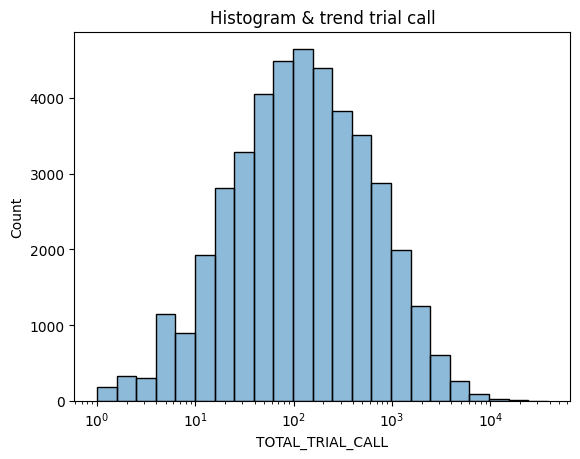

In [33]:
# TOTAL_TRIAL_CALL
sns.histplot(data=df_col, x='TOTAL_TRIAL_CALL', kde=True, bins=100, binwidth=0.2, log_scale=True)
plt.title('Histogram & trend trial call')
plt.show()

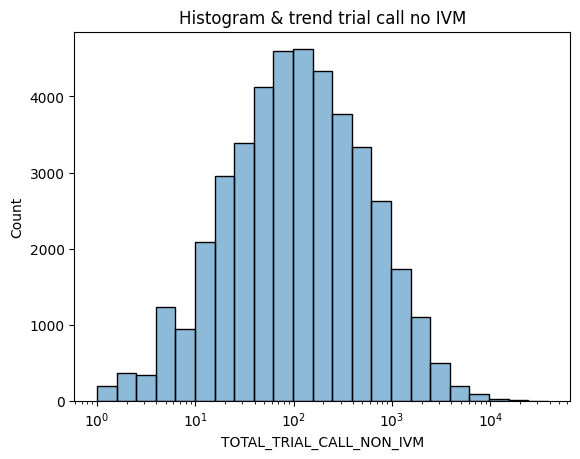

In [34]:
# TOTAL_TRIAL_CALL_NON_IVM
sns.histplot(data=df_col, x='TOTAL_TRIAL_CALL_NON_IVM', kde=True, bins=100, binwidth=0.2, log_scale=True)
plt.title('Histogram & trend trial call no IVM')
plt.show()

In [69]:
df_col[['TOTAL_TRIAL_CALL','TOTAL_TRIAL_CALL_NON_IVM','OVD_AMT_CURR','TOTAL_REFUSE_ACTION','DEMO_MONTHLY_INCOME']].describe()

,TOTAL_TRIAL_CALL,TOTAL_TRIAL_CALL_NON_IVM,OVD_AMT_CURR,TOTAL_REFUSE_ACTION,DEMO_MONTHLY_INCOME
count,45275.000000,45275.000000,4.517300e+04,45275.000000,4.757100e+04
mean,368.513860,331.935616,1.418587e+07,0.744605,8.918966e+10
std,871.874874,813.890144,2.300140e+08,3.444920,9.188015e+12
min,0.000000,0.000000,0.000000e+00,0.000000,2.000000e+04
25%,30.000000,27.000000,0.000000e+00,0.000000,8.000000e+07
50%,108.000000,96.000000,0.000000e+00,0.000000,1.500000e+08
75%,360.000000,316.000000,0.000000e+00,0.000000,3.876208e+08
max,38450.000000,38450.000000,1.377167e+10,204.000000,1.000000e+15


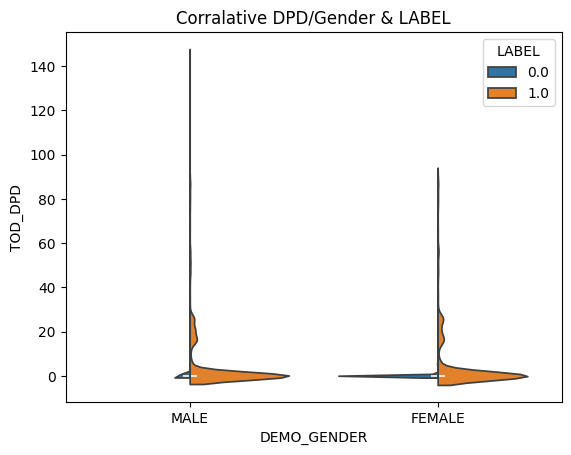

In [47]:
# compare TOD_DPD vs LABEL // DEMO_GENDER
meanprops = {
    'marker': '+',
    'markeredgecolor': 'white',
    'markersize': '10'
}
sns.violinplot(data=df_col, x="DEMO_GENDER", y='TOD_DPD', hue='LABEL',split=True, width=0.8)
plt.title('Corralative DPD/Gender & LABEL')
plt.show()

# FEMALE ít có xu hướng nhảy nhóm tại các DPD thấp hơn la MALE; ngoài ra thì có thể thấy MALE thì có tgian DPD cao hơn

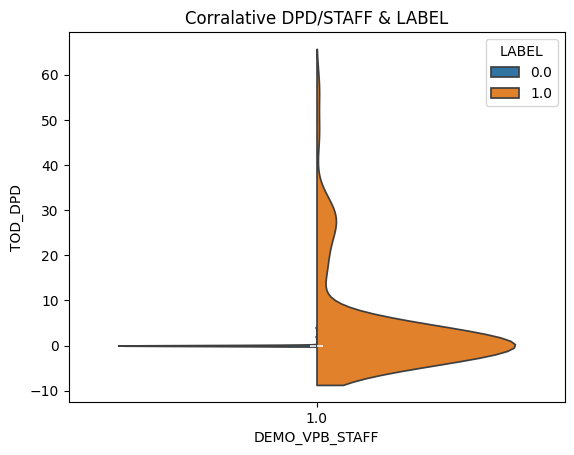

In [53]:
sns.violinplot(data=df_col, x="DEMO_VPB_STAFF", y='TOD_DPD', hue='LABEL',split=True, width=0.8)
plt.title('Corralative DPD/STAFF & LABEL')
plt.show()

In [49]:
demo = [i for i in df_col.columns if 'DEMO' in i]
demo

['DEMO_ACTIVE',
 'DEMO_BRANCH_ID',
 'DEMO_GENDER',
 'DEMO_SECTOR',
 'DEMO_PB_DAO',
 'DEMO_VPB_STAFF',
 'DEMO_MARITAL_STAT',
 'DEMO_EDUCATION',
 'DEMO_RESIDENCE',
 'DEMO_SECTOR_NAME',
 'DEMO_NATIONALITY',
 'DEMO_MONTHLY_INCOME',
 'DEMO_CUS_GROUP',
 'DEMO_ANNUAL_INCOME',
 'DEMO_AGE',
 'DEMO_SEGMENT',
 'DEMO_BLACKLIST',
 'DEMO_MOB',
 'DEMO_SUB_SEGMENT',
 'DEMO_BIRTH_MONTH',
 'DEMO_BIRTH_WEEKDAY',
 'DEMO_BIRTH_SEASON',
 'DEMO_ZODIAC_SIGN',
 'DEMO_DAYS_TO_NEXT_BIRTHDAY',
 'DEMO_VIETNAMESE_ZODIAC',
 'DEMO_PROVINCE',
 'DEMO_MOBILE_BANKING_CUS_INDICATOR',
 'DEMO_ONLINE_BANKING_CUS_INDICATOR']

In [3]:
df_col['DEMO_ZODIAC_SIGN'].value_counts()

DEMO_ZODIAC_SIGN
Libra          5437
Capricorn      5404
Virgo          4525
Leo            4467
Scorpio        4285
Cancer         4197
Taurus         4118
Gemini         3734
Aquarius       3626
Sagittarius    3593
Pisces         3564
Aries          3384
Name: count, dtype: int64

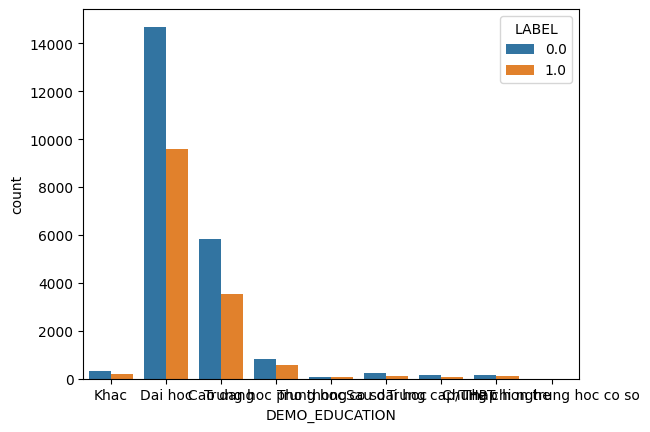

<Figure size 1500x600 with 0 Axes>

In [60]:
sns.countplot(data=df_col, x='DEMO_EDUCATION', hue='LABEL')
plt.figure(figsize=(15,6))
plt.show()

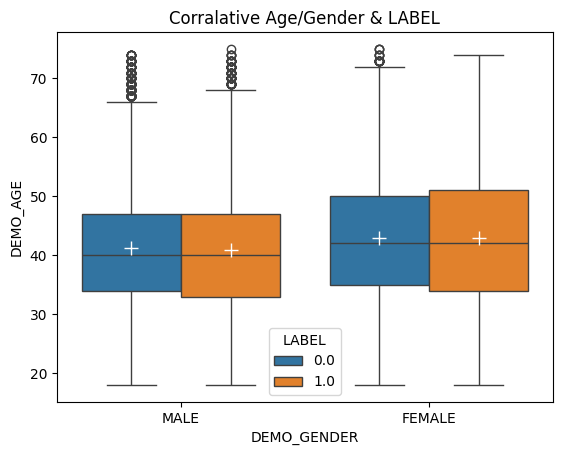

In [61]:
meanprops = {
    'marker': '+',
    'markeredgecolor': 'white',
    'markersize': '10'
}
sns.boxplot(data=df_col, x="DEMO_GENDER", y='DEMO_AGE', hue='LABEL',showmeans=True,meanprops=meanprops)
plt.title('Corralative Age/Gender & LABEL')
plt.show()

# FEMALE co do tuoi trung binh cao hon MALE, ca tren tap nhay nhom (~42yo)
# Do tuoi trung binh cua MALE vs nhom KH co kha nang nhay nhom DPD la thap hn so vs tap ko nhay nhom (~40yo)

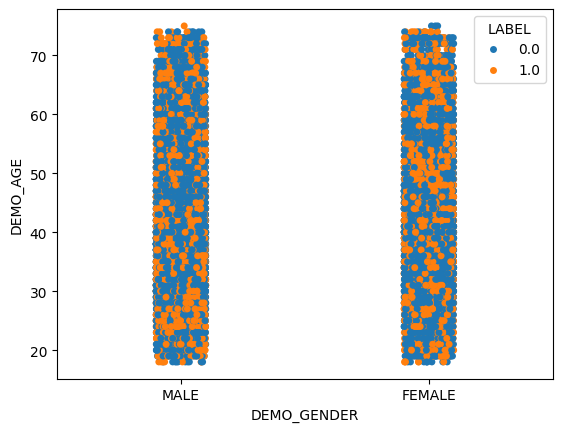

In [63]:
sns.stripplot(data=df_col, x="DEMO_GENDER", y='DEMO_AGE', hue='LABEL')
plt.show()

In [14]:
pivot = df_col[['DEMO_ZODIAC_SIGN','LABEL']].pivot_table(index='DEMO_ZODIAC_SIGN', columns='LABEL', aggfunc='size').reset_index()
pivot.columns = ['DEMO_ZODIAC_SIGN','NO','YES']
pivot['percent'] = pivot['YES'] / pivot['NO']
pivot

,DEMO_ZODIAC_SIGN,NO,YES,percent
0,Aquarius,2203,1423,0.645937
1,Aries,2041,1343,0.658011
2,Cancer,2507,1690,0.674112
3,Capricorn,3186,2218,0.696171
4,Gemini,2245,1489,0.663252
5,Leo,2777,1690,0.608570
6,Libra,3212,2225,0.692715
7,Pisces,2179,1385,0.635613
8,Sagittarius,2223,1370,0.616284
9,Scorpio,2655,1630,0.613936


<Axes: xlabel='DEMO_EDUCATION'>

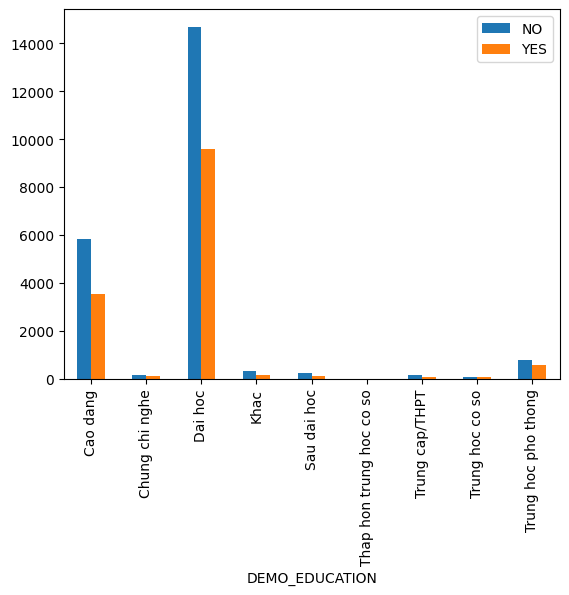

In [25]:
pivot = df_col[['DEMO_EDUCATION','LABEL']].pivot_table(index='DEMO_EDUCATION', columns='LABEL', aggfunc='size').reset_index()
pivot.columns = ['DEMO_EDUCATION','NO','YES']
pivot['percent'] = pivot['YES'] / pivot['NO']
pivot.plot(x='DEMO_EDUCATION', y=['NO','YES'], kind='bar')

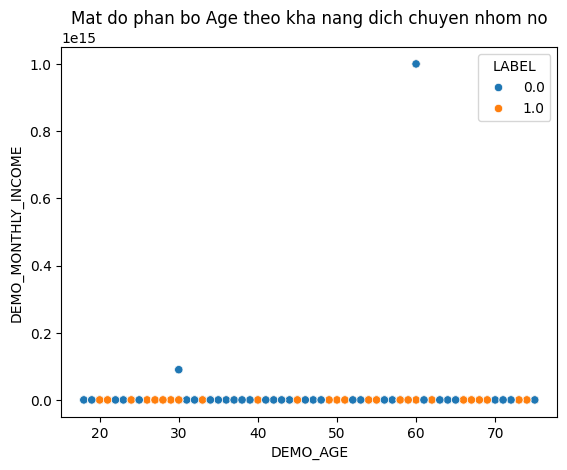

In [68]:
sns.scatterplot(x=df_col['DEMO_AGE'],y=df_col['DEMO_MONTHLY_INCOME'],hue=df_col['LABEL'])
plt.title('Mat do phan bo Age theo kha nang dich chuyen nhom no')
plt.show()

  DEMO_PROVINCE    NO   YES   percent
3        HA NOI  7208  4577  0.634989
6   HO CHI MINH  3377  1662  0.492153
1      BAC NINH  1948  1426  0.732033
0     BAC GIANG  1896  1291  0.680907
9     THANH HOA  1439   873  0.606671
5     HAI PHONG  1407   895  0.636105
8     NINH BINH  1119   734  0.655943
7      NAM DINH   884   617  0.697964
2      DONG NAI   874   516  0.590389
4     HAI DUONG   686   542  0.790087


<Axes: xlabel='DEMO_PROVINCE'>

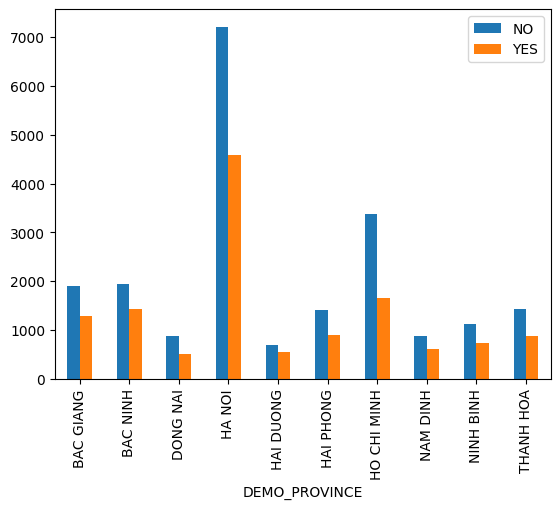

In [23]:
# PROVINCE:
province = list(df_col['DEMO_PROVINCE'].value_counts(ascending=False).head(10).index)
pivot = df_col[df_col['DEMO_PROVINCE'].isin(province)][['DEMO_PROVINCE','LABEL']].pivot_table(index='DEMO_PROVINCE', columns='LABEL', aggfunc='size').reset_index()
pivot.columns = ['DEMO_PROVINCE','NO','YES']
pivot['percent'] = pivot['YES'] / pivot['NO']
print(pivot.sort_values(by='NO', ascending=False))
pivot.plot(x='DEMO_PROVINCE', y=['NO','YES'], kind='bar')

  DEMO_SEGMENT     NO    YES   percent
2     PRIORITY  14094   6781  0.481127
1      MASS AF  13980  10708  0.765951
0         MASS   2535   2236  0.882051


<Axes: xlabel='DEMO_SEGMENT'>

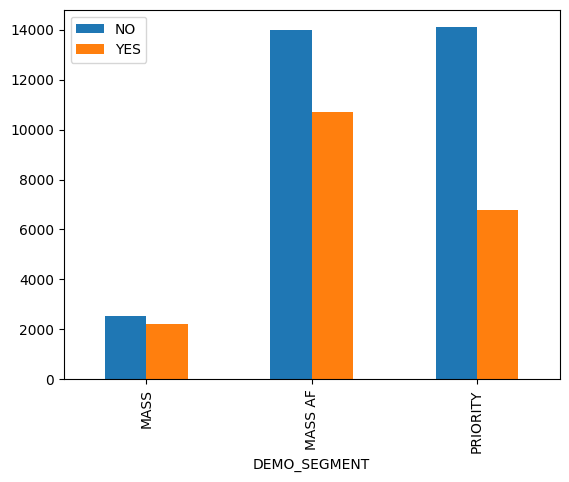

In [13]:
# SEGMENT:
pivot = df_col.pivot_table(index='DEMO_SEGMENT', columns='LABEL', aggfunc='size').reset_index()
pivot.columns = ['DEMO_SEGMENT','NO','YES']
pivot['percent'] = pivot['YES'] / pivot['NO']
print(pivot.sort_values(by='NO', ascending=False))
pivot.plot(x='DEMO_SEGMENT', y=['NO','YES'], kind='bar')

# Phan khuc PRIORITY it co xu huong nhay nhom hon MASS AF
# Ty le chuyen nhom cua MASS rat cao

  DEMO_SEGMENT     NO    YES   percent
0         MASS   2535   2236  0.882051
1      MASS AF  13980  10708  0.765951
2     PRIORITY  14094   6781  0.481127


<Axes: xlabel='DEMO_SEGMENT'>

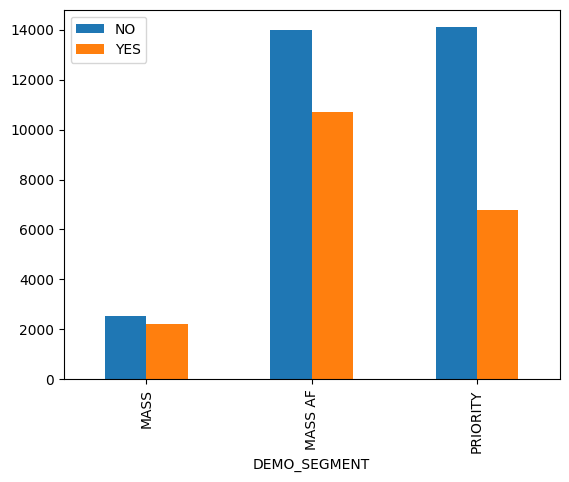

In [4]:
from ultis.ultis import visual_distribution
visual_distribution(df_col, 'DEMO_SEGMENT', 'LABEL')

  DEMO_SUB_SEGMENT    NO   YES   percent
0     AF-Preferred  6539  3130  0.478666
2       AF-Special  6234  2988  0.479307
6        UPPERMEGA  4865  3662  0.752724
3         CHAMPION  3947  3043  0.770965
5           RISING  2654  2038  0.767898
1       AF-Private  1321   663  0.501893
4             MEGA    45    54  1.200000


<Axes: xlabel='DEMO_SUB_SEGMENT'>

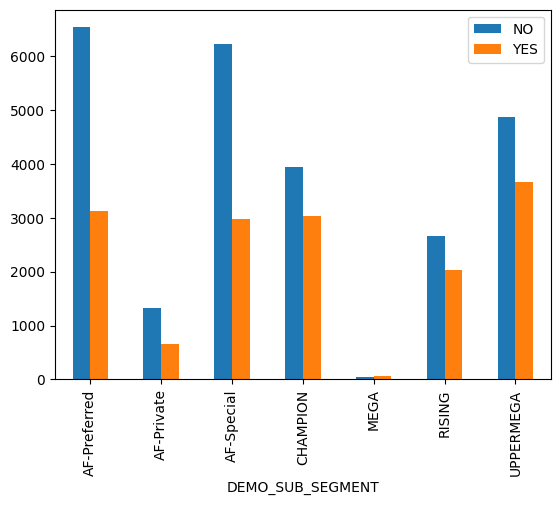

In [27]:
# SUB SEGMENT:
pivot = df_col[['DEMO_SUB_SEGMENT','LABEL']].pivot_table(index='DEMO_SUB_SEGMENT', columns='LABEL', aggfunc='size').reset_index()
pivot.columns = ['DEMO_SUB_SEGMENT','NO','YES']
pivot['percent'] = pivot['YES'] / pivot['NO']
print(pivot.sort_values(by='NO', ascending=False))
pivot.plot(x='DEMO_SUB_SEGMENT', y=['NO','YES'], kind='bar')

# AF-Preferred + AF-Special co ty le dich chuyen thap
# MEGA co muc do dich chuyen rat cao

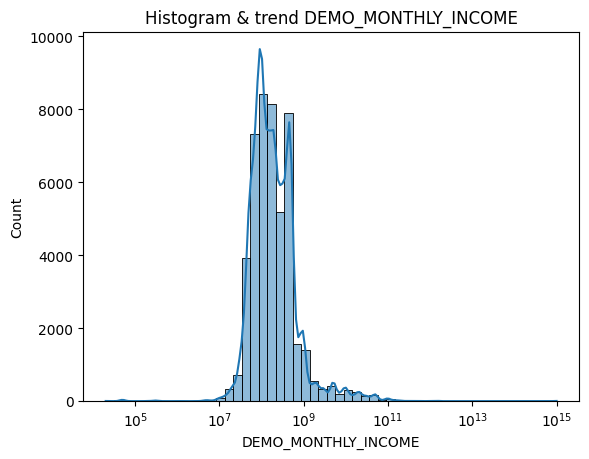

In [5]:
# income monthly:
sns.histplot(data=df_col, x='DEMO_MONTHLY_INCOME', kde=True, bins=100, binwidth=0.2, log_scale=True)
plt.title('Histogram & trend DEMO_MONTHLY_INCOME')
plt.show()

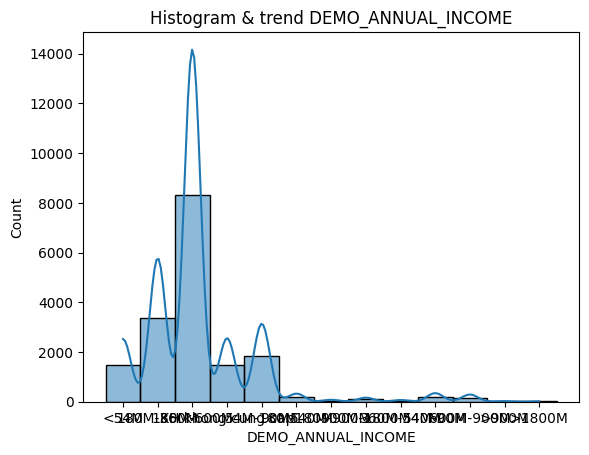

In [9]:
# income annualy:
sns.histplot(data=df_col, x='DEMO_ANNUAL_INCOME', kde=True, bins=1000, binwidth=0.1, log_scale=True)
plt.title('Histogram & trend DEMO_ANNUAL_INCOME')
plt.show()

In [26]:
# check null
from ultis.ultis import miss_report

# miss_report(df_col).to_excel('missing_values_report.xlsx', index=False)
miss = miss_report(df_col)
miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3375 entries, 0 to 3374
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Column        3375 non-null   object 
 1   MissingRatio  3375 non-null   float64
dtypes: float64(1), object(1)
memory usage: 52.9+ KB


In [27]:
col_model = miss[miss['MissingRatio']<=.7]['Column'].tolist()
len(col_model)

1453

### MODEL 2 with only < 0.7 missing values columns

In [28]:
# get dataframe for model2
df2 = df_col[col_model]
df2.shape

(52823, 1453)

In [31]:
categorical_columns = df2.select_dtypes(include=['object']).columns
categorical_columns

Index(['CIF', 'REF_MONTH', 'LABEL_MONTH', 'BOM_BUCKET', 'BOM_BUCKET_GROUP',
       'EOM_BUCKET', 'BOM_BUCKET_CIF', 'BOM_BUCKET_CIF_GROUP',
       'EOM_BUCKET_CIF', 'BUCKET_FINAL',
       ...
       'LOAN_SL_ADB_BAL_AVG_L3M_MLY', 'LOAN_SL_ADB_BAL_SUM_L3M_MLY',
       'LOAN_SL_ADB_BAL_MIN_L6M_MLY', 'LOAN_SL_ADB_BAL_MAX_L6M_MLY',
       'LOAN_SL_ADB_BAL_AVG_L6M_MLY', 'LOAN_SL_ADB_BAL_SUM_L6M_MLY',
       'LOAN_SL_ADB_BAL_MIN_L12M_MLY', 'LOAN_SL_ADB_BAL_MAX_L12M_MLY',
       'LOAN_SL_ADB_BAL_AVG_L12M_MLY', 'LOAN_SL_ADB_BAL_SUM_L12M_MLY'],
      dtype='object', length=384)

In [29]:
# fill NAN values with mean
for col in df2.columns:
    if df2[col].isnull().sum() > 0:
        df2[col] = df2[col].fillna(df2[col].mean())

TypeError: can only concatenate str (not "int") to str

In [16]:
import pandas as pd
from sklearn.metrics import roc_curve, auc

def create_gain_lift_table(y_true, y_proba, bins=100):
    """
    Create a Gain/Lift table to evaluate the performance of a classification model.
    
    Parameters:
    y_true (list or array): True binary labels.
    y_pred (list or array): Predicted probabilities or scores.
    bins (int): Number of bins for the gain/lift table. Defaults to 100.
    
    Returns:
    pd.DataFrame: A DataFrame containing the Gain/Lift table.
    """
    # Create a DataFrame with true labels and predicted scores
    df = pd.DataFrame({'y_true': y_true, 'y_proba': y_proba})
    
    # Bin the scores
    df['bin'] = pd.qcut(df['y_proba'].rank(method='first',ascending=False),bins,labels=False)
    df['bin'] = df['bin']+1
    
    # Calculate the gain and lift
    gain_lift = df.groupby('bin').apply(lambda x: pd.Series({
        'Total': len(x),
        'Positives': x['y_true'].cumsum().iloc[-1],
        'Positives (%)': x['y_true'].mean() * 100,
        'Cumulative Positives (%)': x['y_true'].cumsum().iloc[-1] / df['y_true'].sum() * 100,
        'Cumulative Gain (%)': (x['y_true'].cumsum() / df['y_true'].sum()).iloc[-1] * 100
    })).reset_index()

    
    # Calculate lift
    overall_positive_rate = df['y_true'].mean()
    gain_lift['Lift'] = gain_lift['Positives (%)'] / overall_positive_rate
    
    return gain_lift

# Example usage:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

# Load dataset and split
data = load_breast_cancer()
X = data.data
y = data.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predict probabilities
y_proba = model.predict_proba(X_test)[:, 1]  # Probabilities for the positive class

# Create Gain/Lift table
gain_lift_table = create_gain_lift_table(y_test, y_proba)
gain_lift_table


,bin,Total,Positives,Positives (%),Cumulative Positives (%),Cumulative Gain (%),Lift
0,1,2.0,2.0,100.0,1.851852,1.851852,158.333333
1,2,2.0,2.0,100.0,1.851852,1.851852,158.333333
2,3,2.0,2.0,100.0,1.851852,1.851852,158.333333
3,4,1.0,1.0,100.0,0.925926,0.925926,158.333333
4,5,2.0,2.0,100.0,1.851852,1.851852,158.333333
...,...,...,...,...,...,...,...
95,96,2.0,0.0,0.0,0.000000,0.000000,0.000000
96,97,1.0,0.0,0.0,0.000000,0.000000,0.000000
97,98,2.0,0.0,0.0,0.000000,0.000000,0.000000
98,99,2.0,0.0,0.0,0.000000,0.000000,0.000000


In [ ]:
def test(df,X,model):
    df['Proba'] = model.predict_proba(X)[:, 1] # probality for each data
    df['Decile'] = pd.qcut(df['Proba'].rank(method='first',ascending=False),10,labels=False)
    df['Decile'] = df['Decile']+1
    df['Decile'] = df['Decile']*10
    df['Percentile']  = pd.qcut(df['Proba'].rank(method='first',ascending=True),100,labels=False)
    df['Percentile'] = df['Percentile']+1
    return df[['Decile','Percentile','Proba']]

# NEW DATASET 15-08-2024

In [1]:
import numpy as np
import pandas as pd
import pyodbc
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import os
from ultis.ultis import miss_report, visual_distribution
from ultis.connection import conn_206, conn_117

warnings.filterwarnings('ignore')

In [2]:
dfs = []
folder_path = r'D:\AI_project\DPD10_20240815'

for filename in os.listdir(folder_path):
    if filename.endswith('.parquet'):
        file_path = os.path.join(folder_path, filename)
        df = pd.read_parquet(file_path, engine='pyarrow')
        dfs.append(df)
        
# Gộp tất cả các DataFrame thành một DataFrame duy nhất
df = pd.concat(dfs, ignore_index=True)
print(df.shape)
df.head()

(858323, 504)


,LABEL_MONTH,REF_MONTH,CIF,LABEL,MAX_OVD_MAX_L3M,TOTAL_TRIAL_CALL_NON_IVM,MAX_OVD,LOAN_TYPE_AUTO_PRODUCT_TYPE_MIN_L1M_MLY,TOTAL_TRIAL_CALL_NON_IVM_MAX_L3M,MAX_OVD_MAX_L6M,...,COLLECTION_MEET_CNT_TOTAL_CONTACT_ACTION_AVG_L3M_MLY,COLLECTION_LOAN_AMT_TOTAL_PRINCIPLE_AVG_L3M_MLY,PAID_OFF_MAX_L6M,CASA_TXN_AMT_OUT_MEDIAN_L1M,TOTAL_TRIAL_CALL_5S_MIN_L6M,LOAN_MRTG_RATE_MRTG_BID_RATE_DIFF_3M_MAX_L1M_MLY,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L3M,CC_TXN_AMT_ADB_ONLINE_MEDIAN_L6M_MLY,CASA_NUM_AVG_L1M_DLY,LOAN_MRTG_TIME_TENOR_MAX_L3M_MLY
0,202309,202308,10164861,0,0.0,1.0,0.0,NONE,1.0,2.0,...,0.000000,5.000000e+08,0.0,NaN,0.0,9.56,NaN,NaN,2.0,5.645161
1,202309,202308,10187496,0,NaN,0.0,NaN,NONE,0.0,NaN,...,0.000000,1.299949e+09,0.0,49942000.0,0.0,10.56,49971000.0,42000.0,2.0,5.580645
2,202309,202308,10229086,0,1.0,6.0,1.0,NONE,6.0,2.0,...,0.666667,3.065864e+08,0.0,NaN,0.0,NaN,NaN,12600.0,2.0,NaN
3,202309,202308,10254109,0,0.0,0.0,0.0,NONE,0.0,1.0,...,0.000000,2.142857e+09,0.0,NaN,0.0,NaN,NaN,NaN,2.0,NaN
4,202309,202308,10266070,1,23.0,178.0,21.0,NONE,178.0,23.0,...,9.166667,8.814993e+08,0.0,NaN,8.0,NaN,NaN,35700.0,2.0,NaN


In [3]:
# miss = miss_report(df)
# miss.to_excel('miss_new.xlsx',index=False)


from ultis.ultis import generate_miss_report
generate_miss_report(df)

,features,n_miss,%miss,n_unique,%unique,n_populated,%populated
0,LABEL_MONTH,0,0.00,17,0.00,858323,1.00
1,REF_MONTH,0,0.00,17,0.00,858323,1.00
2,CIF,0,0.00,79639,0.09,858323,1.00
3,LABEL,0,0.00,2,0.00,858323,1.00
4,MAX_OVD_MAX_L3M,197145,0.23,178,0.00,661178,0.77
...,...,...,...,...,...,...,...
499,LOAN_MRTG_RATE_MRTG_BID_RATE_DIFF_3M_MAX_L1M_MLY,608100,0.71,1354,0.00,250223,0.29
500,CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L3M,438614,0.51,69660,0.08,419709,0.49
501,CC_TXN_AMT_ADB_ONLINE_MEDIAN_L6M_MLY,580617,0.68,61287,0.07,277706,0.32
502,CASA_NUM_AVG_L1M_DLY,62654,0.07,1931,0.00,795669,0.93


In [4]:
miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 504 entries, 0 to 503
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Column        504 non-null    object 
 1   MissingRatio  504 non-null    float64
dtypes: float64(1), object(1)
memory usage: 8.0+ KB


In [5]:
usecols = miss[miss['MissingRatio']<.4]['Column']
len(usecols)

359

In [6]:
df_new = df[usecols]
df_new.shape

(858323, 359)

In [7]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858323 entries, 0 to 858322
Columns: 359 entries, LABEL_MONTH to CASA_NUM_AVG_L1M_DLY
dtypes: float64(331), int32(4), object(24)
memory usage: 2.3+ GB


In [8]:
dtypes = df_new.dtypes
object_columns = [col for col in dtypes.index if dtypes[col] == 'object']
object_columns

['LOAN_TYPE_AUTO_PRODUCT_TYPE_MIN_L1M_MLY',
 'DUE_DATE_FINAL_MIN',
 'DUE_DATE_FINAL_MIN_MIN_L6M',
 'DUE_DATE_FINAL_MIN_MIN_L3M',
 'DEMO_PROVINCE',
 'DUE_DATE_FINAL_MAX_MAX_L3M',
 'LOAN_MRTG_GEO_BI_UNIT_MODE_L1M_MLY',
 'LOAN_TYPE_AUTO_CHANNEL_FIRST_L1M_MLY',
 'GPTC_MAX_L6M',
 'DEMO_ZODIAC_SIGN',
 'DEMO_VIETNAMESE_ZODIAC',
 'LOAN_APP_AUTO_AUTO_APP_MAX_L1M_MLY',
 'EOM_BUCKET',
 'COLLATERAL_RANK_AUTO_MIN_MLY',
 'GPTC_MAX_L3M',
 'GPTC',
 'LOAN_LNGR_AUTO_DEBT_GROUP_MAX_L1M_MLY',
 'NEWRB_BUCKET_GROUP_MAX_L3M',
 'DEMO_SUB_SEGMENT',
 'LOAN_CMPGN_AUTO_CAMPAIGN_NAME_FIRST_L1M_MLY',
 'LOAN_LOC_AUTO_BI_REGION_FIRST_L1M_MLY',
 'COLLATERAL_RANK_AUTO_MAX_MLY',
 'COLLECTION_RISK_LV_RISK_LEVEL_MODE_L6M_MLY',
 'DEMO_SECTOR_NAME']

In [9]:
# count NONE values in those cols

df_new[object_columns] = df_new[object_columns].applymap(lambda x: np.nan if x == 'NONE' else x)
df_new[object_columns].isna().sum()

LOAN_TYPE_AUTO_PRODUCT_TYPE_MIN_L1M_MLY        847971
DUE_DATE_FINAL_MIN                              23802
DUE_DATE_FINAL_MIN_MIN_L6M                      23471
DUE_DATE_FINAL_MIN_MIN_L3M                      23485
DEMO_PROVINCE                                   63643
DUE_DATE_FINAL_MAX_MAX_L3M                      23485
LOAN_MRTG_GEO_BI_UNIT_MODE_L1M_MLY             608100
LOAN_TYPE_AUTO_CHANNEL_FIRST_L1M_MLY           848171
GPTC_MAX_L6M                                   512508
DEMO_ZODIAC_SIGN                                61782
DEMO_VIETNAMESE_ZODIAC                          61916
LOAN_APP_AUTO_AUTO_APP_MAX_L1M_MLY             847971
EOM_BUCKET                                      23471
COLLATERAL_RANK_AUTO_MIN_MLY                   849088
GPTC_MAX_L3M                                   335036
GPTC                                           264909
LOAN_LNGR_AUTO_DEBT_GROUP_MAX_L1M_MLY          847971
NEWRB_BUCKET_GROUP_MAX_L3M                      28319
DEMO_SUB_SEGMENT            

In [10]:
numberic_columns = [col for col in df_new.columns if col not in object_columns]
len(numberic_columns)

335

In [11]:
# Fill NAN values with mean
for col in numberic_columns:
    if df_new[col].isnull().sum() > 0:
        df_new[col] = df_new[col].fillna(df_new[col].mean())
    elif df_new[col].isna().sum() > 0:
        df_new[col] = df_new[col].fillna(df_new[col].mean())

In [12]:
# check if there are still NAN columns:
col_nan = []
while col in numberic_columns and df_new[col].isnull().sum() != 0 | df_new[col].isna().sum() != 0:
    col_nan.append(col)
    print(col_nan)
else:
    print('No null values remain. You are good to go!')

No null values remain. You are good to go!


In [13]:
## check if df_dum get any null values:
for column in df_new.columns:
        while df_new[column].isnull().sum() != 0 | df_new[column].isna().sum() != 0:
            print(column,df_new[column].isnull().sum())
        else:
            print('No null values remain. You are good to go!')
            break

No null values remain. You are good to go!


    REF_MONTH     NO   YES   percent
16     202406  46883  3007  0.064138
15     202405  47376  2989  0.063091
14     202404  47902  2655  0.055426
13     202403  48495  2837  0.058501
12     202402  48892  2954  0.060419
11     202401  47815  4551  0.095179
10     202312  48913  3194  0.065300
9      202311  48140  3202  0.066514
8      202309  47647  2701  0.056688
7      202308  45895  3346  0.072906
6      202307  47655  2709  0.056846
5      202306  47601  2741  0.057583
4      202305  47313  2849  0.060216
3      202304  47353  2805  0.059236
2      202303  47126  2621  0.055617
1      202302  47203  2123  0.044976
0      202301  46846  1984  0.042352


<Axes: xlabel='REF_MONTH'>

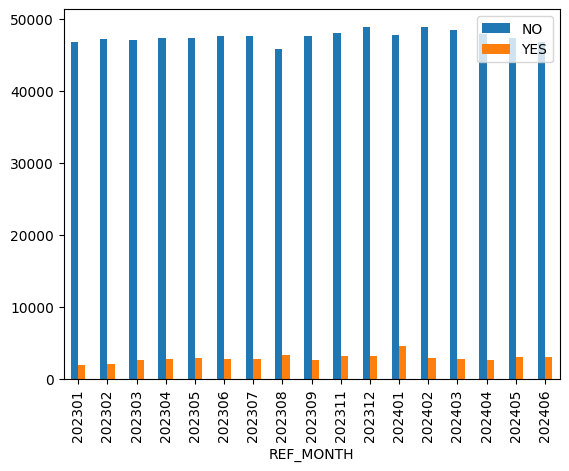

In [14]:
visual_distribution(df_new,'REF_MONTH','LABEL','REF_MONTH')

In [15]:
df_new['LABEL'].value_counts(normalize=True)

LABEL
0    0.9426
1    0.0574
Name: proportion, dtype: float64

In [15]:
df1 = df_new.copy()
df_cat = pd.get_dummies(df1[object_columns])
df1 = pd.concat([df_cat,df1[numberic_columns]],axis=1)
df1['REF_MONTH'] = df1['REF_MONTH'].astype(str)

# assign X - y:
y = df1['LABEL']
X = df1.drop(columns=['LABEL'])

y_test = df1[df1['REF_MONTH'].isin(['202405','202406'])]['LABEL']
y_train = df1[~df1['REF_MONTH'].isin(['202405','202406'])]['LABEL']

X_test = X[X['REF_MONTH'].isin(['202405','202406'])].drop(columns=['REF_MONTH'])
X_train = X[~X['REF_MONTH'].isin(['202405','202406'])].drop(columns=['REF_MONTH'])

class_counts = y_train.value_counts()
class_weights = round(class_counts[0] / class_counts[1])

In [39]:
# feature scaling:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaling_cols = [col for col in numberic_columns if col not in ['LABEL','REF_MONTH']]

X_train_scaler = scaler.fit_transform(X_train[scaling_cols])
X_train_scaler = pd.concat([pd.DataFrame(X_train_scaler),X[object_columns]],axis=1)
X_test_scaler = scaler.transform(X_test[scaling_cols])
X_test_scaler = pd.concat([pd.DataFrame(X_test_scaler),X[object_columns]],axis=1)


In [18]:
# test with random forest => no need to scaler
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(class_weight={0:class_counts[0],1:class_counts[1]})
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)


In [19]:
# scoring model base:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score, roc_auc_score, recall_score
print('THIS IS METRICS FOR MODEL LOGISTIC: \n')
print('Confusion_Matrix is: \n', confusion_matrix(y_test, y_pred))
print('Accuracy is: ', accuracy_score(y_test, y_pred))
print('Precision is: ', precision_score(y_test, y_pred))
print('Recall is: ', recall_score(y_test, y_pred))
print('F1_score is: ', f1_score(y_test, y_pred))
print('ROC_AUC is: ', roc_auc_score(y_test, y_pred))

THIS IS METRICS FOR MODEL LOGISTIC: 

Confusion_Matrix is: 
 [[92691  1568]
 [ 4066  1930]]
Accuracy is:  0.9438033015809685
Precision is:  0.551743853630646
Recall is:  0.3218812541694463
F1_score is:  0.4065725721508321
ROC_AUC is:  0.6526231189422645


In [24]:
import gc
gc.collect()

524

In [23]:
# get feature importance:
coefficients = rf_model.feature_importances_

# Tạo DataFrame để hiển thị độ quan trọng của các đặc trưng
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': coefficients,
    'Absolute Coefficient': abs(coefficients)
}).sort_values(by='Absolute Coefficient', ascending=False)

feature_importance.head(20)

,Feature,Coefficient,Absolute Coefficient
2674,CIF,0.008652,0.008652
2677,MAX_OVD,0.004843,0.004843
2680,TOTAL_TRIAL_CALL,0.004480,0.004480
2676,TOTAL_TRIAL_CALL_NON_IVM,0.004395,0.004395
2691,DEMO_AGE,0.004271,0.004271
2675,MAX_OVD_MAX_L3M,0.004086,0.004086
2713,TOI_GROWTH_RELATIVE_DIF_6M_MLY,0.003970,0.003970
2789,TARGET_OVERALL_AMT_SUM_STD_L3M,0.003822,0.003822
2714,TOI_GROWTH_RELATIVE_DIF_12M_MLY,0.003810,0.003810
2782,TARGET_OVERALL_AMT_SUM_STD_L6M,0.003712,0.003712


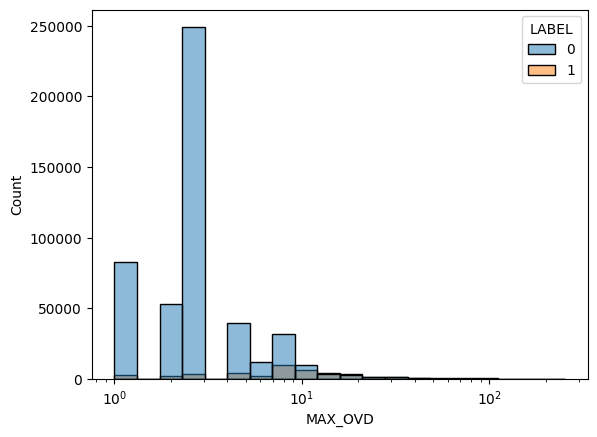

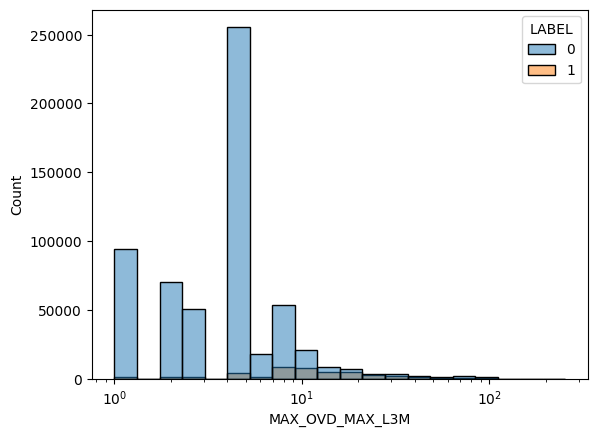

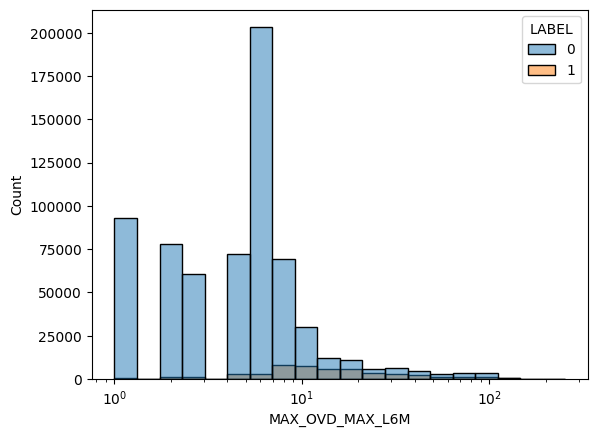

In [43]:
sns.histplot(df1,x='MAX_OVD',hue='LABEL' ,bins=20, log_scale=True)
plt.show()

sns.histplot(df1,x='MAX_OVD_MAX_L3M',hue='LABEL' ,bins=20, log_scale=True)
plt.show()

sns.histplot(df1,x='MAX_OVD_MAX_L6M',hue='LABEL' ,bins=20, log_scale=True)
plt.show()

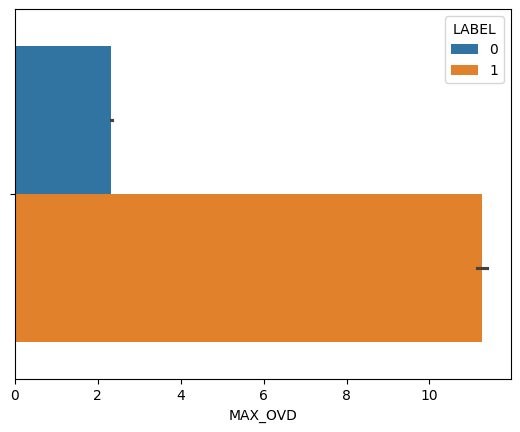

In [35]:
sns.barplot(df1,x='MAX_OVD',hue='LABEL')
plt.show()

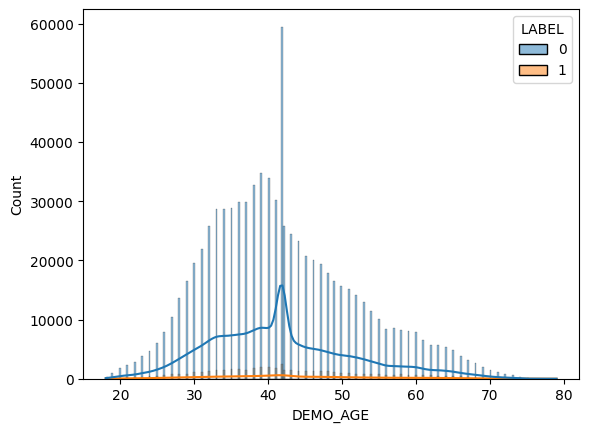

In [41]:
sns.histplot(df1,x='DEMO_AGE',hue='LABEL', kde=True)
plt.show()

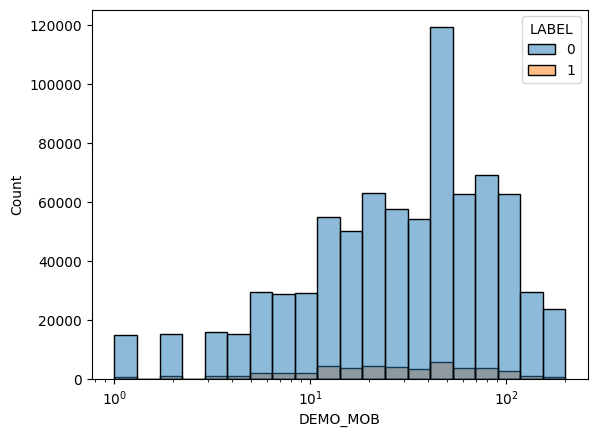

In [45]:
sns.histplot(df1,x='DEMO_MOB',hue='LABEL' ,bins=20, log_scale=True)
plt.show()

In [46]:
df1['DEMO_MOB'].describe()

count    858323.000000
mean         44.881791
std          41.368809
min           0.000000
25%          13.000000
50%          33.000000
75%          64.000000
max         200.000000
Name: DEMO_MOB, dtype: float64

In [49]:
import joblib
from datetime import date

joblib.dump(rf_model, r"D:\AI_project\Khởi kiện sớm GB SEC\rf-{}.sav".format(date.today().strftime("%Y-%m-%d")))

['D:\\AI_project\\Khởi kiện sớm GB SEC\\rf-2024-08-16.sav']

In [ ]:
from ultis.ultis import create_gainlift_table

df2 = pd.concat([X_test,y_test],axis=1)
df2['proba'] = rf_model.predict_proba(X_test)
create_gainlift_table(df2,'proba','LABEL')

# EDA top features for KKS

In [3]:
dfs = []
folder_path = r'D:\AI_project\Khởi kiện sớm GB SEC\data_model'

for filename in os.listdir(folder_path):
    if filename.endswith('.parquet') and filename.startswith('model'):
        file_path = os.path.join(folder_path, filename)
        df = pd.read_parquet(file_path, engine='pyarrow')
        dfs.append(df)
        
# Gộp tất cả các DataFrame thành một DataFrame duy nhất
model = pd.concat(dfs, ignore_index=True)
print(model.shape)
model.head()

(30023, 505)


,LABEL_MONTH,REF_MONTH,CIF,LABEL,EOM_DPD,MAX_OVD,EOM_BUCKET,MODE_BI_CHANNEL_MIN_L6M,MODE_BI_CHANNEL_MIN_L3M,DUE_DATE_FINAL_MIN_MIN_L6M,MAX_OVD_LARGER_THAN_10,MODE_BI_CHANNEL,DUE_DATE_FINAL_MIN_MIN_L3M,DUE_DATE_FINAL_MIN,OVD_AMT_CURR,MAX_OVD_MAX_L6M,MAX_OVD_MAX_L3M,LOAN_MRTG_GEO_BI_UNIT_MODE_L1M_MLY,TOTAL_TRIAL_CALL,OVD_AMT_CURR_MEAN_L3M,DUE_DATE_FINAL_MAX_MIN_L6M,DUE_DATE_FINAL_MAX_MIN_L3M,FLAG_COVERAGE,DEMO_PROVINCE,DUE_DATE_FINAL_MAX,LOAN_SL_ADB_OVD_DAYS_STD_L12M_MLY,COLLECTION_LOAN_AMT_PS_AMOUNT_MAX_L6M_MLY,TOTAL_TRIAL_CALL_NON_IVM,TOTAL_TRIAL_CALL_ACTION,CASA_BAL_REL_GROWTH_L1M_MLY,TOTAL_TRIAL_CALL_IVM_NORMAL,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_AVG_L1M_MLY,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_AVG_L6M_MLY,TOTAL_TRIAL_CALL_ACTION_MAX_L3M,LOAN_SL_ADB_OVD_DAYS_STD_L6M_MLY,CASA_BAL_REL_GROWTH_L3M_MLY,MODE_ZONE_RETAIL_MIN_L6M,AUM_BAL_EOM_1M_MLY,DEMO_VIETNAMESE_ZODIAC,MODE_PRODUCT_NAME_MIN_L3M,MODE_PRODUCT_NAME_MIN_L6M,COLLECTION_LOAN_AMT_PS_AMOUNT_AVG_L6M_MLY,LOAN_MRTG_TIME_TENOR_MAX_L6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L1M_MLY,CASA_TXN_AMT_IN_SUM_L1M,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L3M,AUM_BAL_EOM_STD_6M_MLY,AUM_BAL_ADB_6M_MLY,CASA_BAL_MIN_L1M_DLY,TOTAL_TRIAL_CALL_IVM_NORMAL_MIN_L3M,TOI_BAL_MIN_6M_MLY,RESOLVE_AMT_CIF,MODE_PRODUCT_NAME,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L3M_MLY,CASA_TXN_AMT_IN_MIN_L1M,TOI_BAL_MIN_3M_MLY,MAX_OVD_MIN_L3M,LOAN_LOAN_ADB_DISB_STD_L12M_MLY,CASA_BAL_STD_L1M_DLY,DEMO_AGE,TOI_BAL_STD_6M_MLY,DEMO_ZODIAC_SIGN,TOI_BAL_MED_6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L6M_MLY,COLLECTION_LOAN_AMT_TOTAL_PRINCIPAL_QD_MEDIAN_L1M_MLY,LOAN_SL_ADB_OVD_DAYS_MAX_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L1M,LOAN_LOAN_ADB_OVD_DAYS_STD_L3M_MLY,TOI_BAL_MAX_12M_MLY,LOAN_LOAN_ADB_OVD_DAYS_STD_L6M_MLY,LOAN_MRTG_TIME_TENOR_AVG_L1M_MLY,CASA_BAL_MAX_L1M_DLY,LOAN_SL_EOM_OVD_DAYS_MAX_L12M_MLY,LOAN_MRTG_AMT_MONTHLY_PRINCIPLE_MAX_L1M_MLY,LOAN_LOAN_ADB_BAL_STD_L12M_MLY,AUM_BAL_EOM_STD_3M_MLY,TOI_GROWTH_ABSOLUTE_DIF_12M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MANUAL_MAX_L6M_MLY,CASA_BAL_AVG_L1M_DLY,TOI_BAL_MAX_6M_MLY,EOM_BUCKET_CIF,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L3M_MLY,CASA_BAL_ABS_GROWTH_L6M_MLY,LOAN_SL_ADB_OVD_DAYS_AVG_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L1M,COLLECTION_MEET_DURS_RPC_CALL_PREDICT_CALL_DUR_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_MIN_L6M,LOAN_MRTG_TIME_TENOR_MAX_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L1M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L3M,TOTAL_TRIAL_CALL_MAX_L6M,LOAN_LOAN_EOM_BAL_STD_L1M_MLY,CASA_TXN_AMT_IN_STD_L3M,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_MEDIAN_L3M_MLY,TOI_GROWTH_RELATIVE_DIF_12M_MLY,TOI_BAL_STD_3M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L6M,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L6M_MLY,CASA_BAL_ABS_GROWTH_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L3M_MLY,CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M,LOAN_TOPUP_ADB_BAL_STD_L12M_MLY,CASA_TXN_AMT_IN_MEDIAN_L3M,LOAN_MRTG_CAT_DAO_MODE_L1M_MLY,CASA_TXN_AMT_IN_MAX_L6M,TARGET_OVERALL_AMT_MIN,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L6M,CASA_TXN_AMT_TRANSFER_IN_MIN_L3M,LOAN_SL_EOM_OVD_DAYS_STD_L12M_MLY,OVD_AMT_CURR_STD_L3M,LOAN_SL_EOM_BAL_STD_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_MAX_L3M,AUM_BAL_EOM_MED_3M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MAX_L6M_MLY,LOAN_MRTG_RATE_DCV_RATE_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L6M,CASA_BAL_REL_GROWTH_L6M_MLY,KPTP_AVG,COLLECTION_LOAN_AMT_PS_AMOUNT_SUM_L3M_MLY,DEMO_BIRTH_WEEKDAY,LOAN_SL_EOM_BAL_STD_L6M_MLY,CASA_BAL_ABS_GROWTH_L1M_MLY,COLLECTION_MEET_DURS_TPC_CALL_PREDICT_CALL_DUR_AVG_L1M_MLY,TOI_GROWTH_RELATIVE_DIF_6M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L6M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_ACTION_MAX_L6M_MLY,CC_TXN_AMT_ADB_NON_ECOMMERCE_AVG_L6M_MLY,TOTAL_TRIAL_CALL_MAX_L3M,RESOLVE_AMT_CIF_MIN_L6M,LOAN_MRTG_RATE_RATE_CHANGED_FRE_MIN_L6M_MLY,LOAN_HOMELOAN_ADB_OVD_DAYS_STD_L12M_MLY,LOAN_MRTG_RATE_PAY_RATE_MAX_L3M_MLY,COLLECTION_MEET_CNT_TOTAL_RPC_CALL_SUM_L6M_MLY,TOTAL_PRINCIPLE_CURR_MIN_L3M,LOAN_MRTG_RATE_MRTG_BID_RATE_DIFF_3M_MIN_L6M_MLY,CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_COUNT_L6M,CASA_BAL_MAX_L3M_

In [4]:
dfs = []
folder_path = r'D:\AI_project\Khởi kiện sớm GB SEC\data_model'

for filename in os.listdir(folder_path):
    if filename.endswith('.parquet') and filename.startswith('bau'):
        file_path = os.path.join(folder_path, filename)
        df = pd.read_parquet(file_path, engine='pyarrow')
        dfs.append(df)
        
# Gộp tất cả các DataFrame thành một DataFrame duy nhất
bau = pd.concat(dfs, ignore_index=True)
print(bau.shape)
bau.head()

(5524, 2)


,CIF,LABEL
0,10005194,0
1,10018462,0
2,10038425,0
3,10040597,0
4,10040853,0


In [5]:
bau.CIF = bau.CIF.astype(str)
model.CIF = model.CIF.astype(str)

In [126]:
bau.LABEL.value_counts(normalize=True)

LABEL
0    0.702571
1    0.297429
Name: proportion, dtype: float64

In [127]:
model.LABEL.value_counts(normalize=True)

LABEL
0    0.934017
1    0.065983
Name: proportion, dtype: float64

In [6]:
model['Flag_BAU'] = model['CIF'].isin(bau.CIF.tolist())
model['Flag_BAU'] = model['Flag_BAU'].map({True:'BAU', False:None})
model['Flag_BAU'].value_counts()

Flag_BAU
BAU    5524
Name: count, dtype: int64

In [7]:
# model = model.drop(columns=['Flag_top_model'])
top_indices = model['SCORE'].nlargest(n=5524).index
model['Flag_top_model'] = ''
model.loc[top_indices, 'Flag_top_model'] = 'TOP_SCORE'
# model.iloc[top_indices]['Flag_top_model'] = 'TOP_SCORE'
# model['Flag_top_model'] = model['Flag_top_model'].map({True:'TOP_SCORE', False:None})
model['Flag_top_model']

0        TOP_SCORE
1                 
2                 
3                 
4                 
           ...    
30018             
30019             
30020    TOP_SCORE
30021             
30022             
Name: Flag_top_model, Length: 30023, dtype: object

In [8]:
model[['Flag_top_model','CIF','SCORE']].sort_values(by='SCORE',ascending=False).head(n=10)

,Flag_top_model,CIF,SCORE
16588,TOP_SCORE,11049008,0.998555
1665,TOP_SCORE,10273612,0.998549
14658,TOP_SCORE,5889265,0.998549
1759,TOP_SCORE,14945731,0.998547
10546,TOP_SCORE,10061116,0.998512
19750,TOP_SCORE,7122207,0.998491
11516,TOP_SCORE,13149501,0.998484
18392,TOP_SCORE,11730314,0.998480
2285,TOP_SCORE,8333711,0.998464
25954,TOP_SCORE,11576168,0.998462


In [9]:
model[model['Flag_top_model']=='TOP_SCORE'][['Flag_top_model','CIF','SCORE']].sort_values(by='SCORE',ascending=True).head(n=10)

,Flag_top_model,CIF,SCORE
15996,TOP_SCORE,11357506,0.007356
28334,TOP_SCORE,6408058,0.007357
6988,TOP_SCORE,4473274,0.007357
15061,TOP_SCORE,8676036,0.007357
27272,TOP_SCORE,7832073,0.007358
2184,TOP_SCORE,6213487,0.007359
20827,TOP_SCORE,14944854,0.007360
8876,TOP_SCORE,6143549,0.007360
5054,TOP_SCORE,1968367,0.007360
10178,TOP_SCORE,7781953,0.007361


In [10]:
model['Flag_cross'] = None
cond = (model['Flag_BAU']=='BAU') & (model['Flag_top_model']=='TOP_SCORE')
model.loc[cond,'Flag_cross'] = 'X'
model

,LABEL_MONTH,REF_MONTH,CIF,LABEL,EOM_DPD,MAX_OVD,EOM_BUCKET,MODE_BI_CHANNEL_MIN_L6M,MODE_BI_CHANNEL_MIN_L3M,DUE_DATE_FINAL_MIN_MIN_L6M,MAX_OVD_LARGER_THAN_10,MODE_BI_CHANNEL,DUE_DATE_FINAL_MIN_MIN_L3M,DUE_DATE_FINAL_MIN,OVD_AMT_CURR,MAX_OVD_MAX_L6M,MAX_OVD_MAX_L3M,LOAN_MRTG_GEO_BI_UNIT_MODE_L1M_MLY,TOTAL_TRIAL_CALL,OVD_AMT_CURR_MEAN_L3M,DUE_DATE_FINAL_MAX_MIN_L6M,DUE_DATE_FINAL_MAX_MIN_L3M,FLAG_COVERAGE,DEMO_PROVINCE,DUE_DATE_FINAL_MAX,LOAN_SL_ADB_OVD_DAYS_STD_L12M_MLY,COLLECTION_LOAN_AMT_PS_AMOUNT_MAX_L6M_MLY,TOTAL_TRIAL_CALL_NON_IVM,TOTAL_TRIAL_CALL_ACTION,CASA_BAL_REL_GROWTH_L1M_MLY,TOTAL_TRIAL_CALL_IVM_NORMAL,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_AVG_L1M_MLY,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_AVG_L6M_MLY,TOTAL_TRIAL_CALL_ACTION_MAX_L3M,LOAN_SL_ADB_OVD_DAYS_STD_L6M_MLY,CASA_BAL_REL_GROWTH_L3M_MLY,MODE_ZONE_RETAIL_MIN_L6M,AUM_BAL_EOM_1M_MLY,DEMO_VIETNAMESE_ZODIAC,MODE_PRODUCT_NAME_MIN_L3M,MODE_PRODUCT_NAME_MIN_L6M,COLLECTION_LOAN_AMT_PS_AMOUNT_AVG_L6M_MLY,LOAN_MRTG_TIME_TENOR_MAX_L6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L1M_MLY,CASA_TXN_AMT_IN_SUM_L1M,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L3M,AUM_BAL_EOM_STD_6M_MLY,AUM_BAL_ADB_6M_MLY,CASA_BAL_MIN_L1M_DLY,TOTAL_TRIAL_CALL_IVM_NORMAL_MIN_L3M,TOI_BAL_MIN_6M_MLY,RESOLVE_AMT_CIF,MODE_PRODUCT_NAME,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L3M_MLY,CASA_TXN_AMT_IN_MIN_L1M,TOI_BAL_MIN_3M_MLY,MAX_OVD_MIN_L3M,LOAN_LOAN_ADB_DISB_STD_L12M_MLY,CASA_BAL_STD_L1M_DLY,DEMO_AGE,TOI_BAL_STD_6M_MLY,DEMO_ZODIAC_SIGN,TOI_BAL_MED_6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L6M_MLY,COLLECTION_LOAN_AMT_TOTAL_PRINCIPAL_QD_MEDIAN_L1M_MLY,LOAN_SL_ADB_OVD_DAYS_MAX_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L1M,LOAN_LOAN_ADB_OVD_DAYS_STD_L3M_MLY,TOI_BAL_MAX_12M_MLY,LOAN_LOAN_ADB_OVD_DAYS_STD_L6M_MLY,LOAN_MRTG_TIME_TENOR_AVG_L1M_MLY,CASA_BAL_MAX_L1M_DLY,LOAN_SL_EOM_OVD_DAYS_MAX_L12M_MLY,LOAN_MRTG_AMT_MONTHLY_PRINCIPLE_MAX_L1M_MLY,LOAN_LOAN_ADB_BAL_STD_L12M_MLY,AUM_BAL_EOM_STD_3M_MLY,TOI_GROWTH_ABSOLUTE_DIF_12M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MANUAL_MAX_L6M_MLY,CASA_BAL_AVG_L1M_DLY,TOI_BAL_MAX_6M_MLY,EOM_BUCKET_CIF,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L3M_MLY,CASA_BAL_ABS_GROWTH_L6M_MLY,LOAN_SL_ADB_OVD_DAYS_AVG_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L1M,COLLECTION_MEET_DURS_RPC_CALL_PREDICT_CALL_DUR_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_MIN_L6M,LOAN_MRTG_TIME_TENOR_MAX_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L1M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L3M,TOTAL_TRIAL_CALL_MAX_L6M,LOAN_LOAN_EOM_BAL_STD_L1M_MLY,CASA_TXN_AMT_IN_STD_L3M,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_MEDIAN_L3M_MLY,TOI_GROWTH_RELATIVE_DIF_12M_MLY,TOI_BAL_STD_3M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L6M,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L6M_MLY,CASA_BAL_ABS_GROWTH_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L3M_MLY,CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M,LOAN_TOPUP_ADB_BAL_STD_L12M_MLY,CASA_TXN_AMT_IN_MEDIAN_L3M,LOAN_MRTG_CAT_DAO_MODE_L1M_MLY,CASA_TXN_AMT_IN_MAX_L6M,TARGET_OVERALL_AMT_MIN,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L6M,CASA_TXN_AMT_TRANSFER_IN_MIN_L3M,LOAN_SL_EOM_OVD_DAYS_STD_L12M_MLY,OVD_AMT_CURR_STD_L3M,LOAN_SL_EOM_BAL_STD_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_MAX_L3M,AUM_BAL_EOM_MED_3M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MAX_L6M_MLY,LOAN_MRTG_RATE_DCV_RATE_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L6M,CASA_BAL_REL_GROWTH_L6M_MLY,KPTP_AVG,COLLECTION_LOAN_AMT_PS_AMOUNT_SUM_L3M_MLY,DEMO_BIRTH_WEEKDAY,LOAN_SL_EOM_BAL_STD_L6M_MLY,CASA_BAL_ABS_GROWTH_L1M_MLY,COLLECTION_MEET_DURS_TPC_CALL_PREDICT_CALL_DUR_AVG_L1M_MLY,TOI_GROWTH_RELATIVE_DIF_6M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L6M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_ACTION_MAX_L6M_MLY,CC_TXN_AMT_ADB_NON_ECOMMERCE_AVG_L6M_MLY,TOTAL_TRIAL_CALL_MAX_L3M,RESOLVE_AMT_CIF_MIN_L6M,LOAN_MRTG_RATE_RATE_CHANGED_FRE_MIN_L6M_MLY,LOAN_HOMELOAN_ADB_OVD_DAYS_STD_L12M_MLY,LOAN_MRTG_RATE_PAY_RATE_MAX_L3M_MLY,COLLECTION_MEET_CNT_TOTAL_RPC_CALL_SUM_L6M_MLY,TOTAL_PRINCIPLE_CURR_MIN_L3M,LOAN_MRTG_RATE_MRTG_BID_RATE_DIFF_3M_MIN_L6M_MLY,CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_COUNT_L6M,CASA_BAL_MAX_L3M_

In [17]:
model[model['Flag_cross']=='X'].shape

(4122, 508)

In [11]:
df_bau = model[model['Flag_BAU']=='BAU']
df_model = model[model['Flag_top_model']=='TOP_SCORE']

In [135]:
df_bau.shape

(5524, 508)

In [12]:
df_model_uni = df_model[df_model['Flag_cross']!='X']
df_model_uni # df model chi ra khac vs BAU la 1402 CIF

,LABEL_MONTH,REF_MONTH,CIF,LABEL,EOM_DPD,MAX_OVD,EOM_BUCKET,MODE_BI_CHANNEL_MIN_L6M,MODE_BI_CHANNEL_MIN_L3M,DUE_DATE_FINAL_MIN_MIN_L6M,MAX_OVD_LARGER_THAN_10,MODE_BI_CHANNEL,DUE_DATE_FINAL_MIN_MIN_L3M,DUE_DATE_FINAL_MIN,OVD_AMT_CURR,MAX_OVD_MAX_L6M,MAX_OVD_MAX_L3M,LOAN_MRTG_GEO_BI_UNIT_MODE_L1M_MLY,TOTAL_TRIAL_CALL,OVD_AMT_CURR_MEAN_L3M,DUE_DATE_FINAL_MAX_MIN_L6M,DUE_DATE_FINAL_MAX_MIN_L3M,FLAG_COVERAGE,DEMO_PROVINCE,DUE_DATE_FINAL_MAX,LOAN_SL_ADB_OVD_DAYS_STD_L12M_MLY,COLLECTION_LOAN_AMT_PS_AMOUNT_MAX_L6M_MLY,TOTAL_TRIAL_CALL_NON_IVM,TOTAL_TRIAL_CALL_ACTION,CASA_BAL_REL_GROWTH_L1M_MLY,TOTAL_TRIAL_CALL_IVM_NORMAL,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_AVG_L1M_MLY,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_AVG_L6M_MLY,TOTAL_TRIAL_CALL_ACTION_MAX_L3M,LOAN_SL_ADB_OVD_DAYS_STD_L6M_MLY,CASA_BAL_REL_GROWTH_L3M_MLY,MODE_ZONE_RETAIL_MIN_L6M,AUM_BAL_EOM_1M_MLY,DEMO_VIETNAMESE_ZODIAC,MODE_PRODUCT_NAME_MIN_L3M,MODE_PRODUCT_NAME_MIN_L6M,COLLECTION_LOAN_AMT_PS_AMOUNT_AVG_L6M_MLY,LOAN_MRTG_TIME_TENOR_MAX_L6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L1M_MLY,CASA_TXN_AMT_IN_SUM_L1M,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L3M,AUM_BAL_EOM_STD_6M_MLY,AUM_BAL_ADB_6M_MLY,CASA_BAL_MIN_L1M_DLY,TOTAL_TRIAL_CALL_IVM_NORMAL_MIN_L3M,TOI_BAL_MIN_6M_MLY,RESOLVE_AMT_CIF,MODE_PRODUCT_NAME,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L3M_MLY,CASA_TXN_AMT_IN_MIN_L1M,TOI_BAL_MIN_3M_MLY,MAX_OVD_MIN_L3M,LOAN_LOAN_ADB_DISB_STD_L12M_MLY,CASA_BAL_STD_L1M_DLY,DEMO_AGE,TOI_BAL_STD_6M_MLY,DEMO_ZODIAC_SIGN,TOI_BAL_MED_6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L6M_MLY,COLLECTION_LOAN_AMT_TOTAL_PRINCIPAL_QD_MEDIAN_L1M_MLY,LOAN_SL_ADB_OVD_DAYS_MAX_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L1M,LOAN_LOAN_ADB_OVD_DAYS_STD_L3M_MLY,TOI_BAL_MAX_12M_MLY,LOAN_LOAN_ADB_OVD_DAYS_STD_L6M_MLY,LOAN_MRTG_TIME_TENOR_AVG_L1M_MLY,CASA_BAL_MAX_L1M_DLY,LOAN_SL_EOM_OVD_DAYS_MAX_L12M_MLY,LOAN_MRTG_AMT_MONTHLY_PRINCIPLE_MAX_L1M_MLY,LOAN_LOAN_ADB_BAL_STD_L12M_MLY,AUM_BAL_EOM_STD_3M_MLY,TOI_GROWTH_ABSOLUTE_DIF_12M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MANUAL_MAX_L6M_MLY,CASA_BAL_AVG_L1M_DLY,TOI_BAL_MAX_6M_MLY,EOM_BUCKET_CIF,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L3M_MLY,CASA_BAL_ABS_GROWTH_L6M_MLY,LOAN_SL_ADB_OVD_DAYS_AVG_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L1M,COLLECTION_MEET_DURS_RPC_CALL_PREDICT_CALL_DUR_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_MIN_L6M,LOAN_MRTG_TIME_TENOR_MAX_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L1M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L3M,TOTAL_TRIAL_CALL_MAX_L6M,LOAN_LOAN_EOM_BAL_STD_L1M_MLY,CASA_TXN_AMT_IN_STD_L3M,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_MEDIAN_L3M_MLY,TOI_GROWTH_RELATIVE_DIF_12M_MLY,TOI_BAL_STD_3M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L6M,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L6M_MLY,CASA_BAL_ABS_GROWTH_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L3M_MLY,CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M,LOAN_TOPUP_ADB_BAL_STD_L12M_MLY,CASA_TXN_AMT_IN_MEDIAN_L3M,LOAN_MRTG_CAT_DAO_MODE_L1M_MLY,CASA_TXN_AMT_IN_MAX_L6M,TARGET_OVERALL_AMT_MIN,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L6M,CASA_TXN_AMT_TRANSFER_IN_MIN_L3M,LOAN_SL_EOM_OVD_DAYS_STD_L12M_MLY,OVD_AMT_CURR_STD_L3M,LOAN_SL_EOM_BAL_STD_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_MAX_L3M,AUM_BAL_EOM_MED_3M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MAX_L6M_MLY,LOAN_MRTG_RATE_DCV_RATE_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L6M,CASA_BAL_REL_GROWTH_L6M_MLY,KPTP_AVG,COLLECTION_LOAN_AMT_PS_AMOUNT_SUM_L3M_MLY,DEMO_BIRTH_WEEKDAY,LOAN_SL_EOM_BAL_STD_L6M_MLY,CASA_BAL_ABS_GROWTH_L1M_MLY,COLLECTION_MEET_DURS_TPC_CALL_PREDICT_CALL_DUR_AVG_L1M_MLY,TOI_GROWTH_RELATIVE_DIF_6M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L6M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_ACTION_MAX_L6M_MLY,CC_TXN_AMT_ADB_NON_ECOMMERCE_AVG_L6M_MLY,TOTAL_TRIAL_CALL_MAX_L3M,RESOLVE_AMT_CIF_MIN_L6M,LOAN_MRTG_RATE_RATE_CHANGED_FRE_MIN_L6M_MLY,LOAN_HOMELOAN_ADB_OVD_DAYS_STD_L12M_MLY,LOAN_MRTG_RATE_PAY_RATE_MAX_L3M_MLY,COLLECTION_MEET_CNT_TOTAL_RPC_CALL_SUM_L6M_MLY,TOTAL_PRINCIPLE_CURR_MIN_L3M,LOAN_MRTG_RATE_MRTG_BID_RATE_DIFF_3M_MIN_L6M_MLY,CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_COUNT_L6M,CASA_BAL_MAX_L3M_

In [13]:
df_model_uni[df_model_uni['Flag_BAU']=='BAU']

,LABEL_MONTH,REF_MONTH,CIF,LABEL,EOM_DPD,MAX_OVD,EOM_BUCKET,MODE_BI_CHANNEL_MIN_L6M,MODE_BI_CHANNEL_MIN_L3M,DUE_DATE_FINAL_MIN_MIN_L6M,MAX_OVD_LARGER_THAN_10,MODE_BI_CHANNEL,DUE_DATE_FINAL_MIN_MIN_L3M,DUE_DATE_FINAL_MIN,OVD_AMT_CURR,MAX_OVD_MAX_L6M,MAX_OVD_MAX_L3M,LOAN_MRTG_GEO_BI_UNIT_MODE_L1M_MLY,TOTAL_TRIAL_CALL,OVD_AMT_CURR_MEAN_L3M,DUE_DATE_FINAL_MAX_MIN_L6M,DUE_DATE_FINAL_MAX_MIN_L3M,FLAG_COVERAGE,DEMO_PROVINCE,DUE_DATE_FINAL_MAX,LOAN_SL_ADB_OVD_DAYS_STD_L12M_MLY,COLLECTION_LOAN_AMT_PS_AMOUNT_MAX_L6M_MLY,TOTAL_TRIAL_CALL_NON_IVM,TOTAL_TRIAL_CALL_ACTION,CASA_BAL_REL_GROWTH_L1M_MLY,TOTAL_TRIAL_CALL_IVM_NORMAL,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_AVG_L1M_MLY,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_AVG_L6M_MLY,TOTAL_TRIAL_CALL_ACTION_MAX_L3M,LOAN_SL_ADB_OVD_DAYS_STD_L6M_MLY,CASA_BAL_REL_GROWTH_L3M_MLY,MODE_ZONE_RETAIL_MIN_L6M,AUM_BAL_EOM_1M_MLY,DEMO_VIETNAMESE_ZODIAC,MODE_PRODUCT_NAME_MIN_L3M,MODE_PRODUCT_NAME_MIN_L6M,COLLECTION_LOAN_AMT_PS_AMOUNT_AVG_L6M_MLY,LOAN_MRTG_TIME_TENOR_MAX_L6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L1M_MLY,CASA_TXN_AMT_IN_SUM_L1M,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L3M,AUM_BAL_EOM_STD_6M_MLY,AUM_BAL_ADB_6M_MLY,CASA_BAL_MIN_L1M_DLY,TOTAL_TRIAL_CALL_IVM_NORMAL_MIN_L3M,TOI_BAL_MIN_6M_MLY,RESOLVE_AMT_CIF,MODE_PRODUCT_NAME,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L3M_MLY,CASA_TXN_AMT_IN_MIN_L1M,TOI_BAL_MIN_3M_MLY,MAX_OVD_MIN_L3M,LOAN_LOAN_ADB_DISB_STD_L12M_MLY,CASA_BAL_STD_L1M_DLY,DEMO_AGE,TOI_BAL_STD_6M_MLY,DEMO_ZODIAC_SIGN,TOI_BAL_MED_6M_MLY,LOAN_MRTG_RATE_PRINCIPLE_PAID_RATE_MIN_L6M_MLY,COLLECTION_LOAN_AMT_TOTAL_PRINCIPAL_QD_MEDIAN_L1M_MLY,LOAN_SL_ADB_OVD_DAYS_MAX_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L1M,LOAN_LOAN_ADB_OVD_DAYS_STD_L3M_MLY,TOI_BAL_MAX_12M_MLY,LOAN_LOAN_ADB_OVD_DAYS_STD_L6M_MLY,LOAN_MRTG_TIME_TENOR_AVG_L1M_MLY,CASA_BAL_MAX_L1M_DLY,LOAN_SL_EOM_OVD_DAYS_MAX_L12M_MLY,LOAN_MRTG_AMT_MONTHLY_PRINCIPLE_MAX_L1M_MLY,LOAN_LOAN_ADB_BAL_STD_L12M_MLY,AUM_BAL_EOM_STD_3M_MLY,TOI_GROWTH_ABSOLUTE_DIF_12M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MANUAL_MAX_L6M_MLY,CASA_BAL_AVG_L1M_DLY,TOI_BAL_MAX_6M_MLY,EOM_BUCKET_CIF,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L3M_MLY,CASA_BAL_ABS_GROWTH_L6M_MLY,LOAN_SL_ADB_OVD_DAYS_AVG_L12M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L1M,COLLECTION_MEET_DURS_RPC_CALL_PREDICT_CALL_DUR_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_MIN_L6M,LOAN_MRTG_TIME_TENOR_MAX_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L1M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L3M,TOTAL_TRIAL_CALL_MAX_L6M,LOAN_LOAN_EOM_BAL_STD_L1M_MLY,CASA_TXN_AMT_IN_STD_L3M,COLLECTION_LOAN_AMT_TOTAL_INTEREST_QD_MEDIAN_L3M_MLY,TOI_GROWTH_RELATIVE_DIF_12M_MLY,TOI_BAL_STD_3M_MLY,CASA_TXN_AMT_TRANSFER_IN_STD_L6M,COLLECTION_LOAN_AMT_PR_AMOUNT_SUM_L6M_MLY,CASA_BAL_ABS_GROWTH_L3M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L3M_MLY,CASA_TXN_AMT_TRANSFER_OUT_MIN_L3M,LOAN_TOPUP_ADB_BAL_STD_L12M_MLY,CASA_TXN_AMT_IN_MEDIAN_L3M,LOAN_MRTG_CAT_DAO_MODE_L1M_MLY,CASA_TXN_AMT_IN_MAX_L6M,TARGET_OVERALL_AMT_MIN,TOTAL_TRIAL_CALL_IVM_NORMAL_MAX_L6M,CASA_TXN_AMT_TRANSFER_IN_MIN_L3M,LOAN_SL_EOM_OVD_DAYS_STD_L12M_MLY,OVD_AMT_CURR_STD_L3M,LOAN_SL_EOM_BAL_STD_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_MAX_L3M,AUM_BAL_EOM_MED_3M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_CALL_MAX_L6M_MLY,LOAN_MRTG_RATE_DCV_RATE_AVG_L3M_MLY,CASA_TXN_AMT_TRANSFER_IN_AVG_L6M,CASA_BAL_REL_GROWTH_L6M_MLY,KPTP_AVG,COLLECTION_LOAN_AMT_PS_AMOUNT_SUM_L3M_MLY,DEMO_BIRTH_WEEKDAY,LOAN_SL_EOM_BAL_STD_L6M_MLY,CASA_BAL_ABS_GROWTH_L1M_MLY,COLLECTION_MEET_DURS_TPC_CALL_PREDICT_CALL_DUR_AVG_L1M_MLY,TOI_GROWTH_RELATIVE_DIF_6M_MLY,LOAN_MRTG_TIME_TENOR_MIN_L6M_MLY,COLLECTION_MEET_CNT_TOTAL_TRIAL_ACTION_MAX_L6M_MLY,CC_TXN_AMT_ADB_NON_ECOMMERCE_AVG_L6M_MLY,TOTAL_TRIAL_CALL_MAX_L3M,RESOLVE_AMT_CIF_MIN_L6M,LOAN_MRTG_RATE_RATE_CHANGED_FRE_MIN_L6M_MLY,LOAN_HOMELOAN_ADB_OVD_DAYS_STD_L12M_MLY,LOAN_MRTG_RATE_PAY_RATE_MAX_L3M_MLY,COLLECTION_MEET_CNT_TOTAL_RPC_CALL_SUM_L6M_MLY,TOTAL_PRINCIPLE_CURR_MIN_L3M,LOAN_MRTG_RATE_MRTG_BID_RATE_DIFF_3M_MIN_L6M_MLY,CASA_TXN_AMT_TRANSFER_OUT_SUM_L1M,CASA_TXN_AMT_TRANSFER_IN_COUNT_L6M,CASA_BAL_MAX_L3M_

In [16]:
df_model_uni['CIF'].nunique()

1402

In [14]:
df_model_uni['LABEL'].value_counts()

LABEL
0    1191
1     211
Name: count, dtype: int64

In [77]:
df_model_uni['SCORE'].describe()

count    1402.000000
mean        0.067819
std         0.210216
min         0.007356
25%         0.007860
50%         0.009032
75%         0.014657
max         0.998414
Name: SCORE, dtype: float64

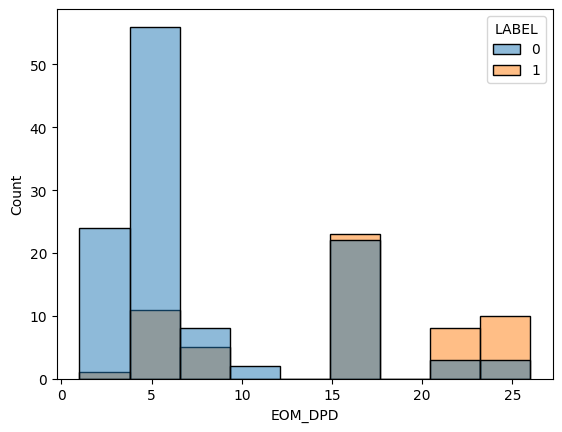

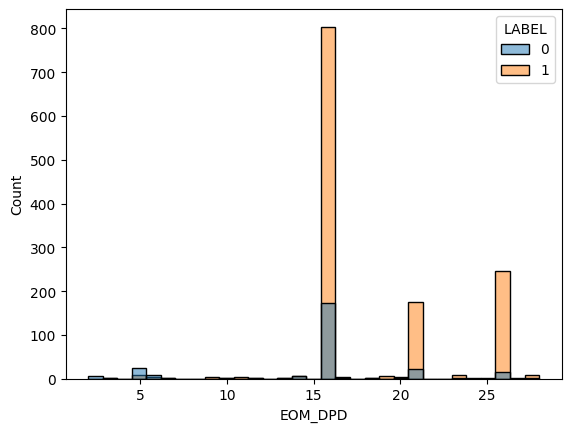

In [82]:
sns.histplot(df_model_uni,x='EOM_DPD',hue='LABEL')
plt.show()

sns.histplot(df_bau,x='EOM_DPD',hue='LABEL')
plt.show()

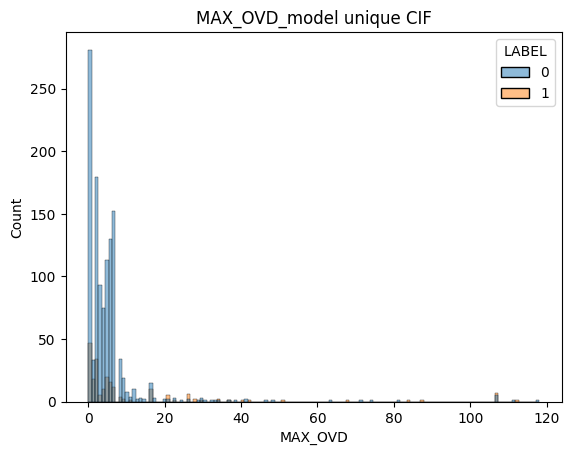

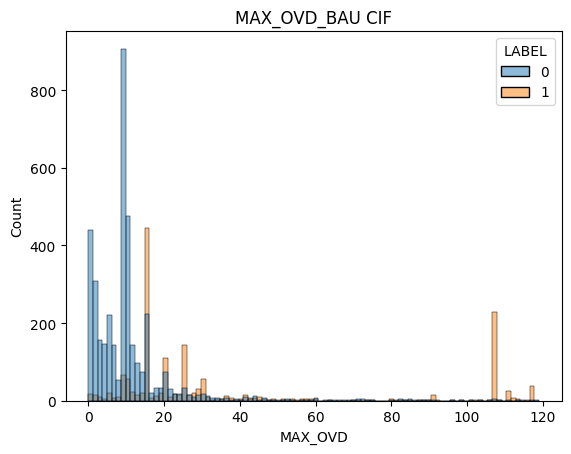

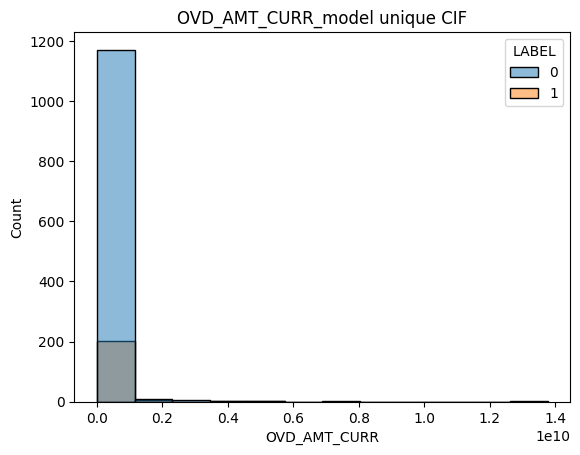

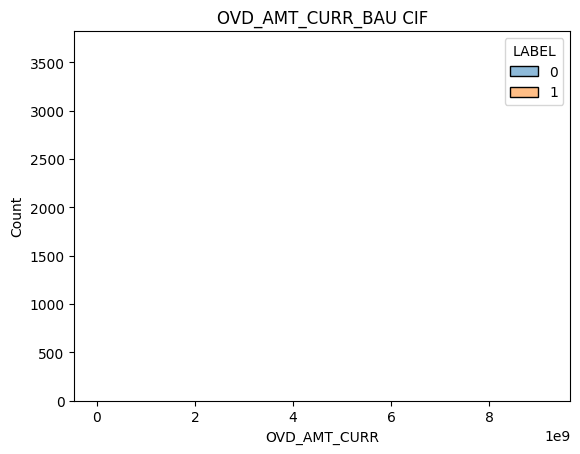

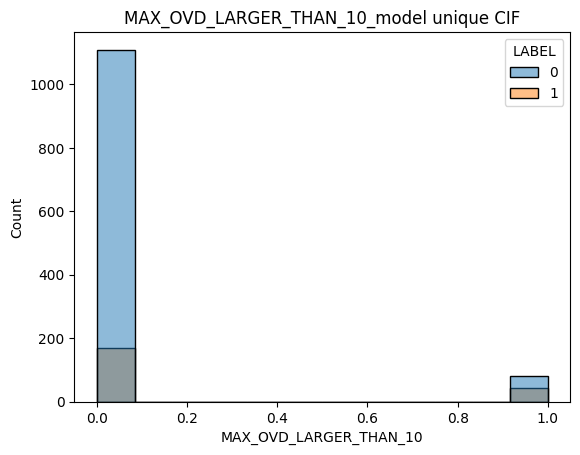

...

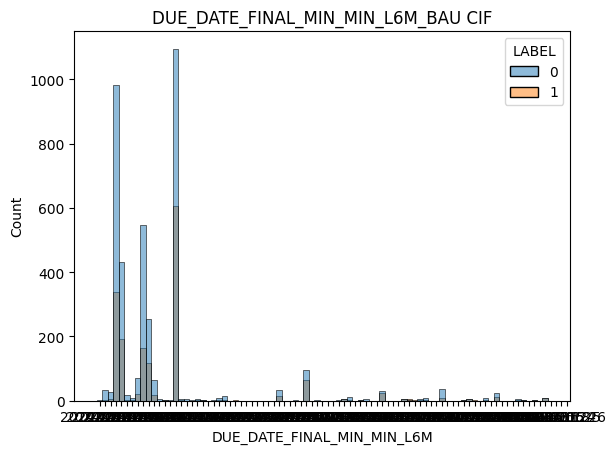

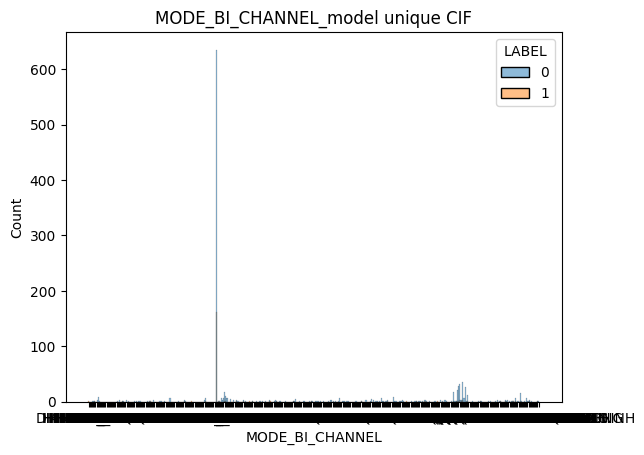

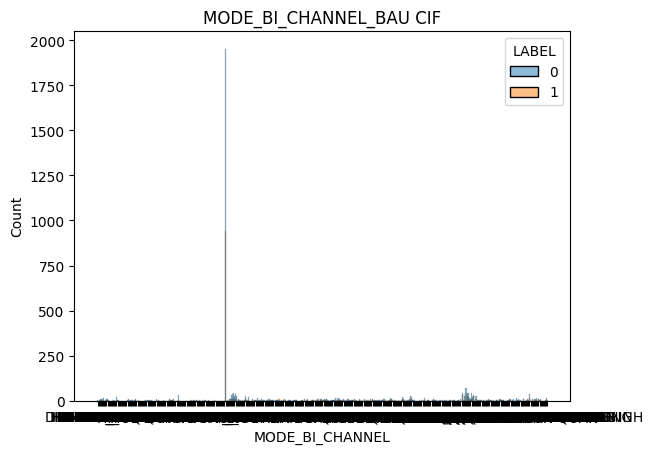

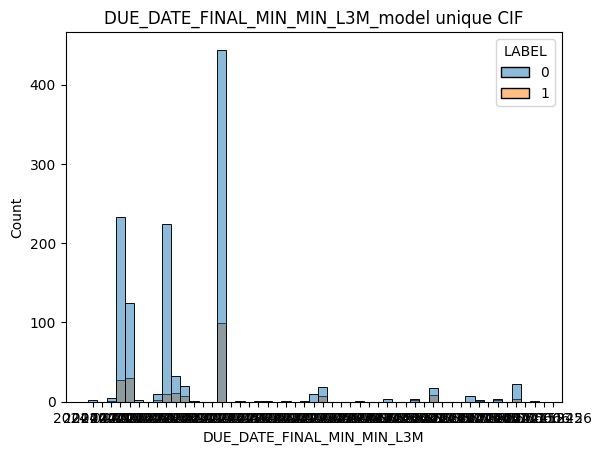

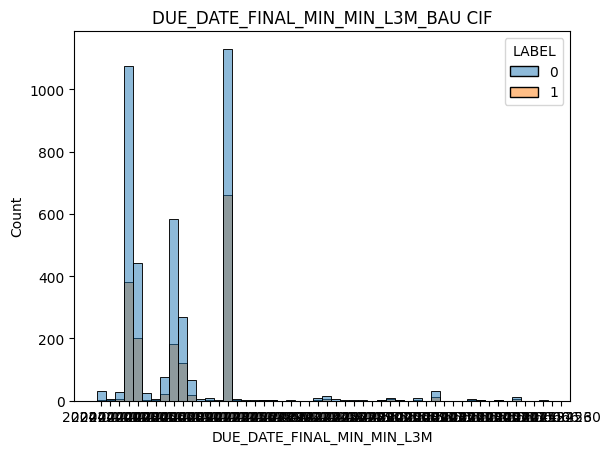

In [84]:
col = ['MAX_OVD','OVD_AMT_CURR','MAX_OVD_LARGER_THAN_10','EOM_BUCKET_CIF','EOM_BUCKET','TOD_DPD_MAX_L3M','OVD_AMT_CURR_MEAN_L3M',
       'MAX_OVD_MAX_L3M','MODE_BI_CHANNEL_MIN_L6M','MODE_BI_CHANNEL_MIN_L3M','DUE_DATE_FINAL_MIN_MIN_L6M',
       'MODE_BI_CHANNEL','DUE_DATE_FINAL_MIN_MIN_L3M']

for col in col:
    sns.histplot(df_model_uni,x=col,hue='LABEL')
    plt.title(f'{col}_model unique CIF')
    plt.show()

    sns.histplot(df_bau,x=col,hue='LABEL')
    plt.title(f'{col}_BAU CIF')
    plt.show()

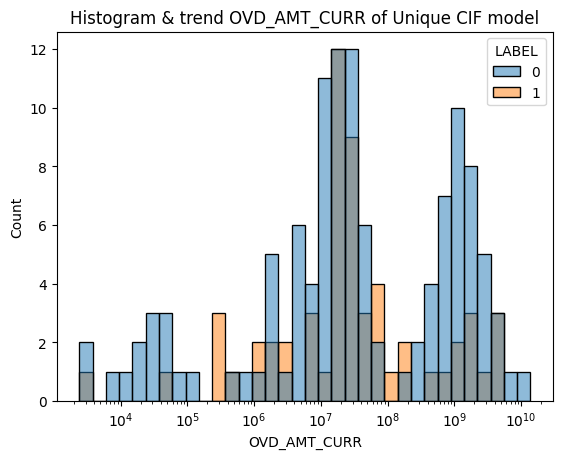

In [91]:
sns.histplot(df_model_uni, x='OVD_AMT_CURR',hue='LABEL', bins=50, binwidth=0.2,log_scale=True)
plt.title('Histogram & trend OVD_AMT_CURR of Unique CIF model')
plt.show()

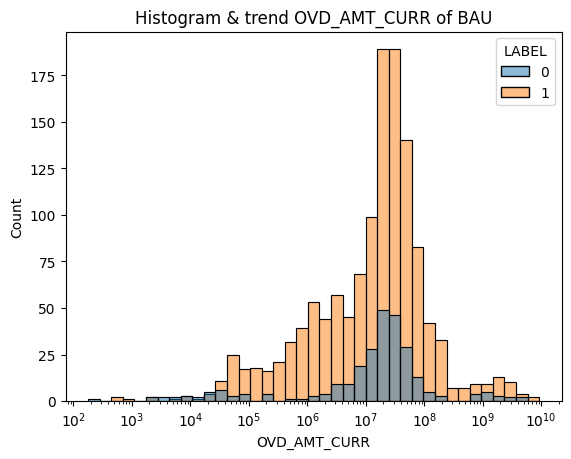

In [90]:
sns.histplot(df_bau, x='OVD_AMT_CURR',hue='LABEL', bins=50, binwidth=0.2,log_scale=True)
plt.title('Histogram & trend OVD_AMT_CURR of BAU')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

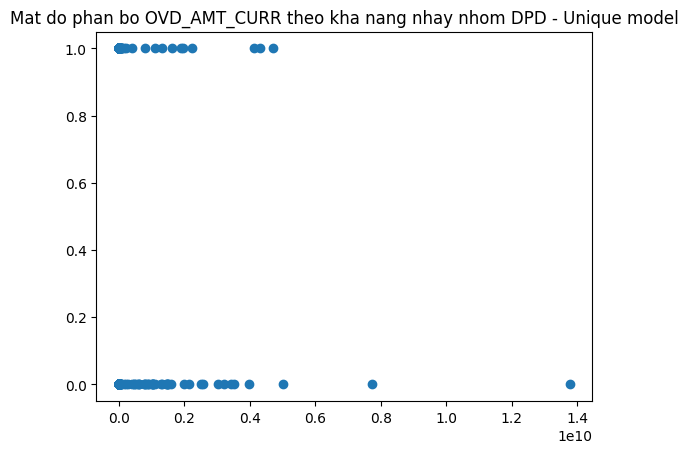

In [93]:
plt.scatter(df_model_uni['OVD_AMT_CURR'],df_model_uni['LABEL'])
plt.title('Mat do phan bo OVD_AMT_CURR theo kha nang nhay nhom DPD - Unique model')
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

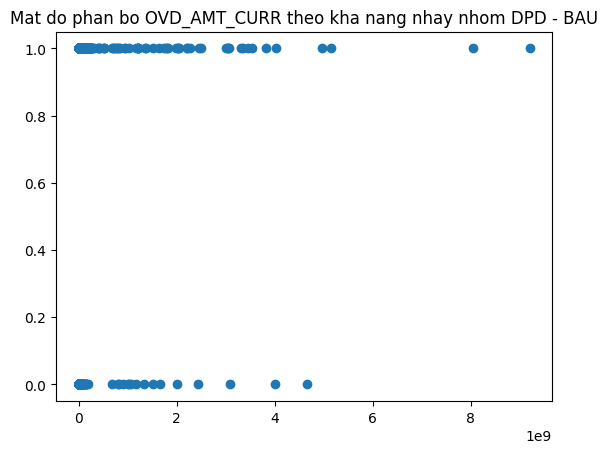

In [94]:
plt.scatter(df_bau['OVD_AMT_CURR'],df_bau['LABEL'])
plt.title('Mat do phan bo OVD_AMT_CURR theo kha nang nhay nhom DPD - BAU')
plt.show

In [156]:
lt = []
for col in df_model_uni.columns:
    if 'toi' in col.lower():
        lt.append(col)
lt

['TOI_BAL_MIN_6M_MLY',
 'TOI_BAL_MIN_3M_MLY',
 'TOI_BAL_STD_6M_MLY',
 'TOI_BAL_MED_6M_MLY',
 'TOI_BAL_MAX_12M_MLY',
 'TOI_GROWTH_ABSOLUTE_DIF_12M_MLY',
 'TOI_BAL_MAX_6M_MLY',
 'TOI_GROWTH_RELATIVE_DIF_12M_MLY',
 'TOI_BAL_STD_3M_MLY',
 'TOI_GROWTH_RELATIVE_DIF_6M_MLY',
 'TOI_BAL_AVG_6M_MLY',
 'TOI_BAL_AVG_1M_MLY',
 'TOI_BAL_MAX_3M_MLY',
 'TOI_BAL_MIN_12M_MLY',
 'TOI_BAL_STD_12M_MLY',
 'TOI_GROWTH_ABSOLUTE_DIF_6M_MLY',
 'TOI_BAL_MED_12M_MLY',
 'TOI_BAL_MED_3M_MLY',
 'TOI_BAL_AVG_3M_MLY']

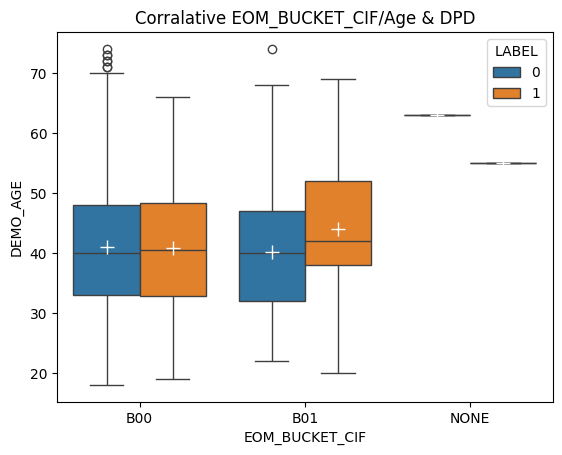

In [100]:
meanprops = {
    'marker': '+',
    'markeredgecolor': 'white',
    'markersize': '10'
}
sns.boxplot(data=df_model_uni, x="EOM_BUCKET_CIF", y='DEMO_AGE', hue='LABEL',showmeans=True,meanprops=meanprops)
plt.title('Corralative EOM_BUCKET_CIF/Age & DPD')
plt.show()

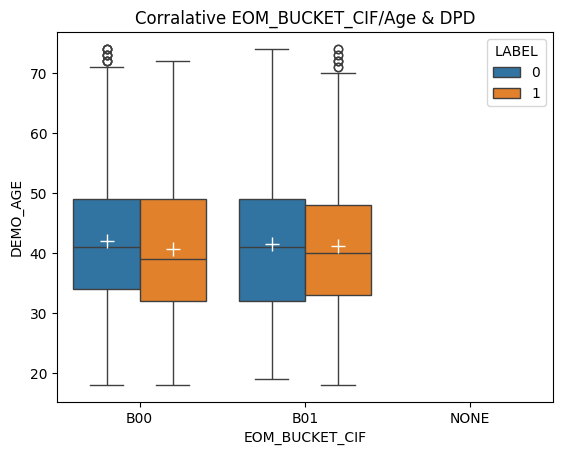

In [101]:
meanprops = {
    'marker': '+',
    'markeredgecolor': 'white',
    'markersize': '10'
}
sns.boxplot(data=df_bau, x="EOM_BUCKET_CIF", y='DEMO_AGE', hue='LABEL',showmeans=True,meanprops=meanprops)
plt.title('Corralative EOM_BUCKET_CIF/Age & DPD')
plt.show()

<Axes: >

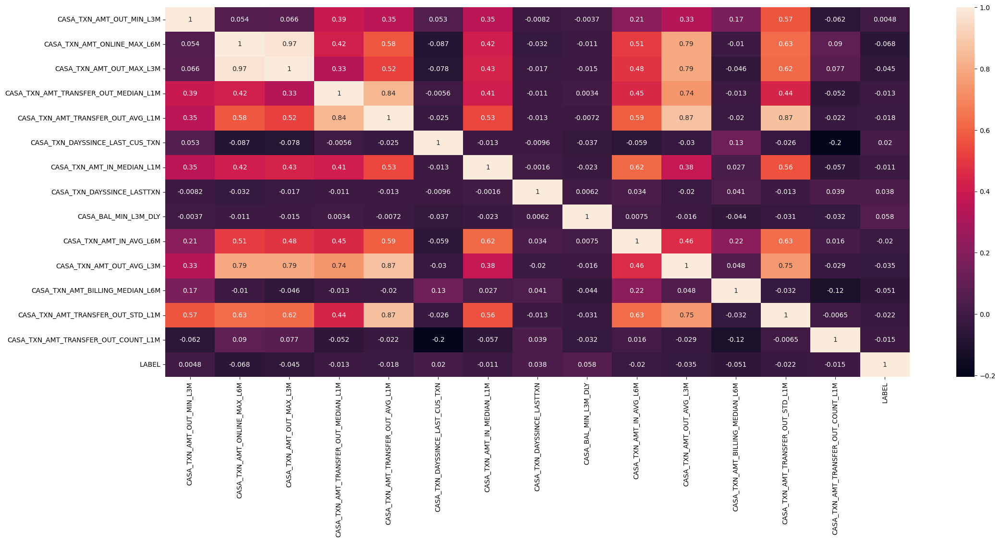

In [113]:
lt = ['CASA_TXN_AMT_OUT_MIN_L3M',
 'CASA_TXN_AMT_ONLINE_MAX_L6M',
 'CASA_TXN_AMT_OUT_MAX_L3M',
 'CASA_TXN_AMT_TRANSFER_OUT_MEDIAN_L1M',
 'CASA_TXN_AMT_TRANSFER_OUT_AVG_L1M',
 'CASA_TXN_DAYSSINCE_LAST_CUS_TXN',
 'CASA_TXN_AMT_IN_MEDIAN_L1M',
 'CASA_TXN_DAYSSINCE_LASTTXN',
 'CASA_BAL_MIN_L3M_DLY',
 'CASA_TXN_AMT_IN_AVG_L6M',
 'CASA_TXN_AMT_OUT_AVG_L3M',
 'CASA_TXN_AMT_BILLING_MEDIAN_L6M',
 'CASA_TXN_AMT_TRANSFER_OUT_STD_L1M',
 'CASA_TXN_AMT_TRANSFER_OUT_COUNT_L1M','LABEL']
plt.figure(figsize=(25, 10))
sns.heatmap(df_model_uni[lt].corr(), annot=True, )

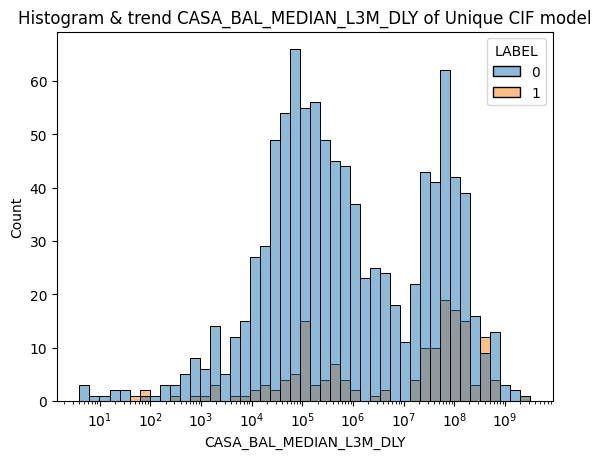

In [115]:
sns.histplot(df_model_uni, x='CASA_BAL_MEDIAN_L3M_DLY',hue='LABEL', bins=50, binwidth=0.2,log_scale=True)
plt.title('Histogram & trend CASA_BAL_MEDIAN_L3M_DLY of Unique CIF model')
plt.show()

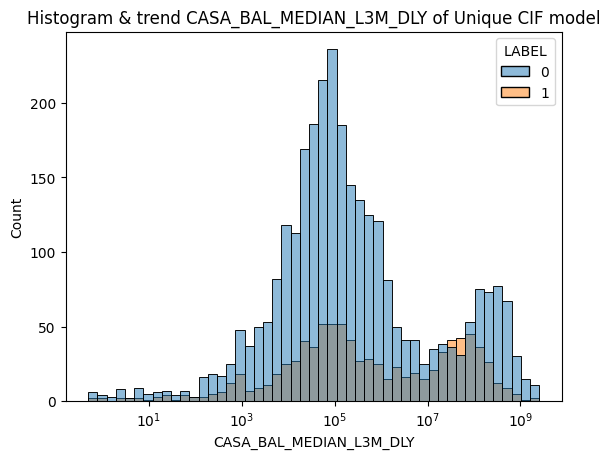

In [116]:
sns.histplot(df_bau, x='CASA_BAL_MEDIAN_L3M_DLY',hue='LABEL', bins=50, binwidth=0.2,log_scale=True)
plt.title('Histogram & trend CASA_BAL_MEDIAN_L3M_DLY of BAU model')
plt.show()

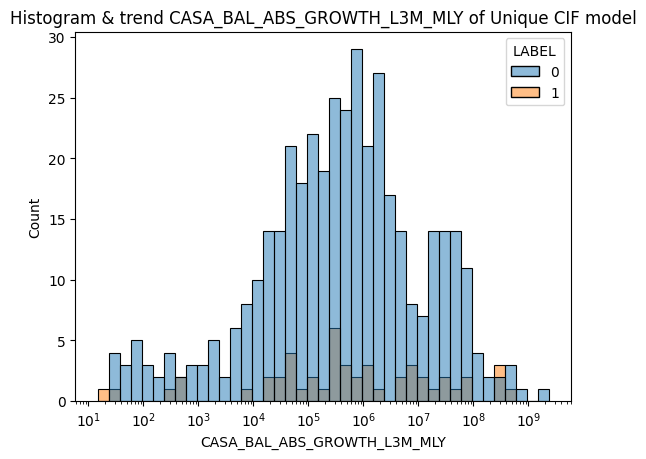

In [117]:
sns.histplot(df_model_uni, x='CASA_BAL_ABS_GROWTH_L3M_MLY',hue='LABEL', bins=50, binwidth=0.2,log_scale=True)
plt.title('Histogram & trend CASA_BAL_ABS_GROWTH_L3M_MLY of Unique CIF model')
plt.show()

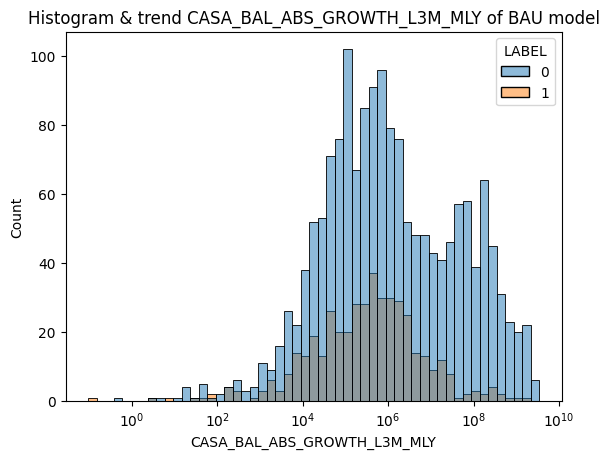

In [118]:
sns.histplot(df_bau, x='CASA_BAL_ABS_GROWTH_L3M_MLY',hue='LABEL', bins=50, binwidth=0.2,log_scale=True)
plt.title('Histogram & trend CASA_BAL_ABS_GROWTH_L3M_MLY of BAU model')
plt.show()

In [140]:
df_top_cif = df_model_uni.loc[df_model_uni['SCORE'].nlargest(20).index,['CIF','SCORE']]
df_top_cif

,CIF,SCORE
4863,8119345,0.998414
19318,14092906,0.998403
14230,11727236,0.998284
9171,6018526,0.998174
29281,11053776,0.998095
19974,4511168,0.998087
9875,8179238,0.997998
6715,6754909,0.997858
5527,9208666,0.997747
23248,6846073,0.997688


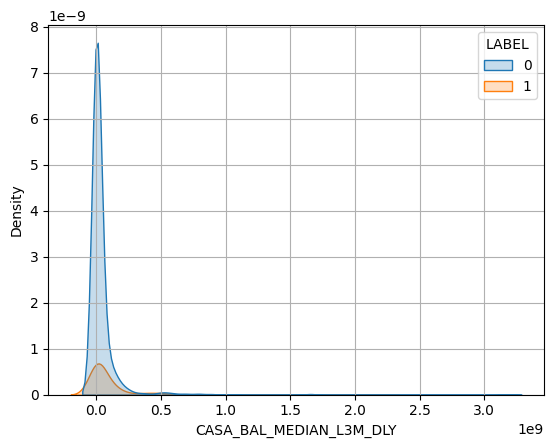

In [146]:
sns.kdeplot(data=df_model_uni, x='CASA_BAL_MEDIAN_L3M_DLY',hue='LABEL', fill=True,)
plt.grid(True)
plt.show()

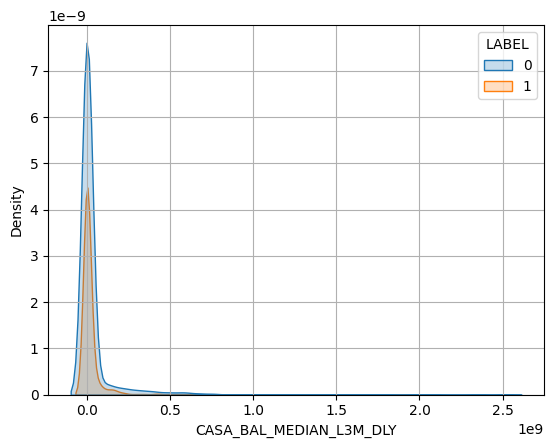

In [147]:
sns.kdeplot(data=df_bau, x='CASA_BAL_MEDIAN_L3M_DLY',hue='LABEL', fill=True,)
plt.grid(True)
plt.show()

##### => muc do tang BALANCE L3M se lam giam kha nang dich chuyen DPD; vay neu am thi xs nhay DPD se cao

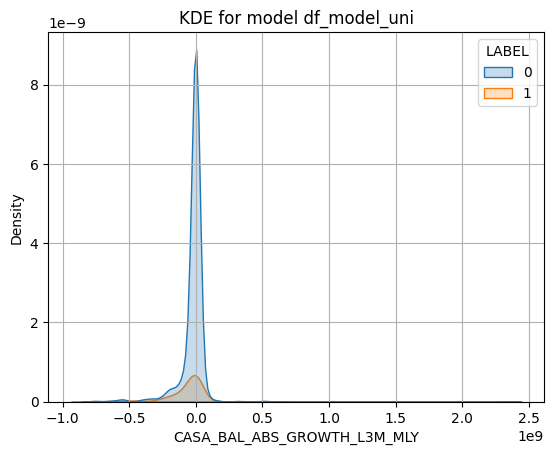

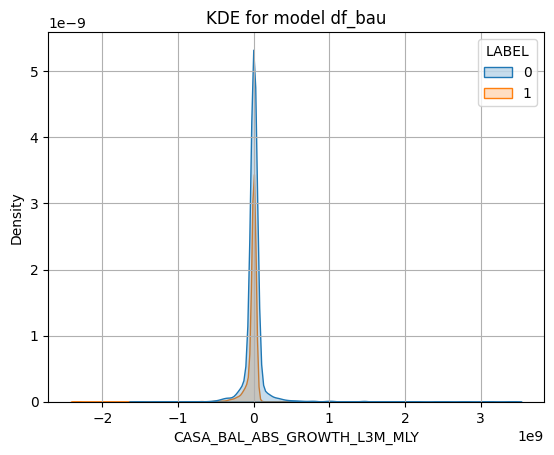

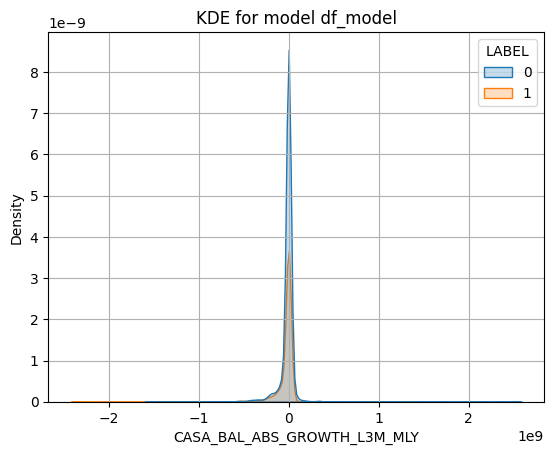

In [154]:
dataframes = [df_model_uni, df_bau, df_model]
labels = ['df_model_uni', 'df_bau', 'df_model']
for df,label in zip(dataframes, labels):
    sns.kdeplot(data=df, x='CASA_BAL_ABS_GROWTH_L3M_MLY',hue='LABEL', fill=True,)
    plt.grid(True)
    plt.title(f'KDE for model {label}')
    plt.show()

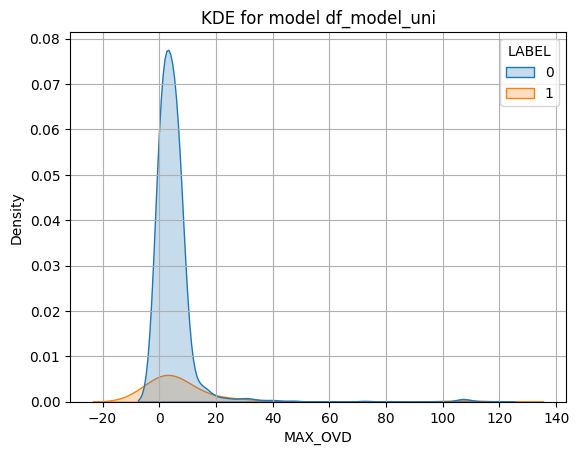

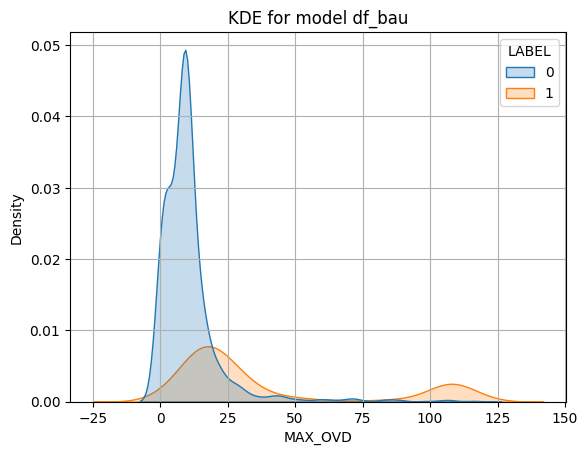

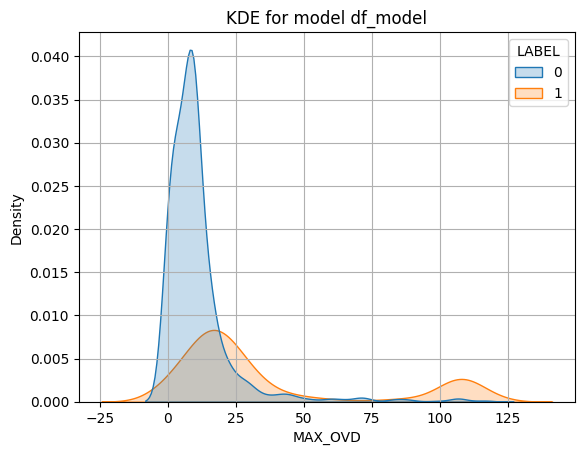

In [155]:
dataframes = [df_model_uni, df_bau, df_model]
labels = ['df_model_uni', 'df_bau', 'df_model']
for df,label in zip(dataframes, labels):
    sns.kdeplot(data=df, x='MAX_OVD',hue='LABEL', fill=True,)
    plt.grid(True)
    plt.title(f'KDE for model {label}')
    plt.show()

<Axes: >

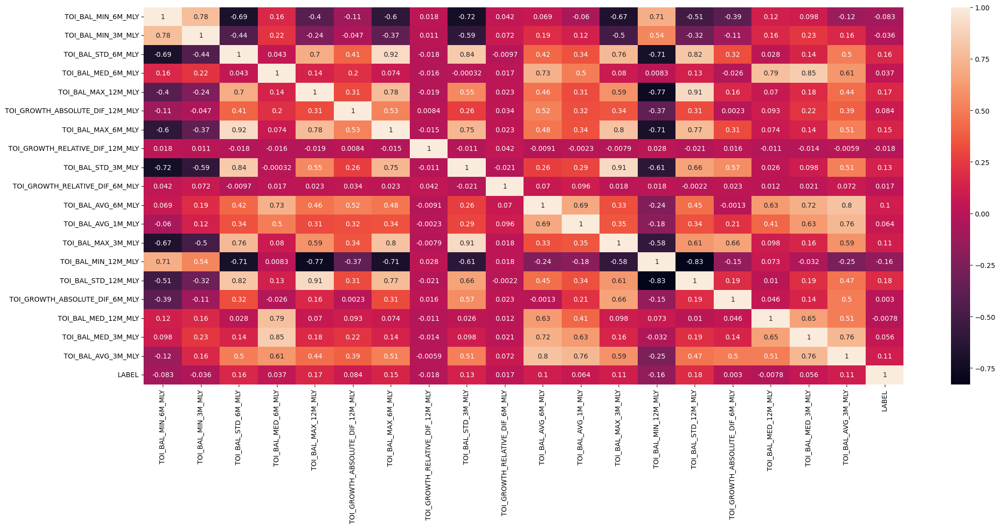

In [157]:
toi = ['TOI_BAL_MIN_6M_MLY',
 'TOI_BAL_MIN_3M_MLY',
 'TOI_BAL_STD_6M_MLY',
 'TOI_BAL_MED_6M_MLY',
 'TOI_BAL_MAX_12M_MLY',
 'TOI_GROWTH_ABSOLUTE_DIF_12M_MLY',
 'TOI_BAL_MAX_6M_MLY',
 'TOI_GROWTH_RELATIVE_DIF_12M_MLY',
 'TOI_BAL_STD_3M_MLY',
 'TOI_GROWTH_RELATIVE_DIF_6M_MLY',
 'TOI_BAL_AVG_6M_MLY',
 'TOI_BAL_AVG_1M_MLY',
 'TOI_BAL_MAX_3M_MLY',
 'TOI_BAL_MIN_12M_MLY',
 'TOI_BAL_STD_12M_MLY',
 'TOI_GROWTH_ABSOLUTE_DIF_6M_MLY',
 'TOI_BAL_MED_12M_MLY',
 'TOI_BAL_MED_3M_MLY',
 'TOI_BAL_AVG_3M_MLY','LABEL']
plt.figure(figsize=(25, 10))
sns.heatmap(df_model_uni[toi].corr(), annot=True, )

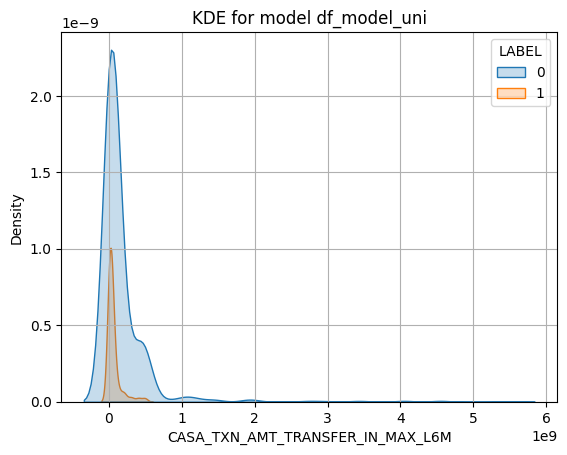

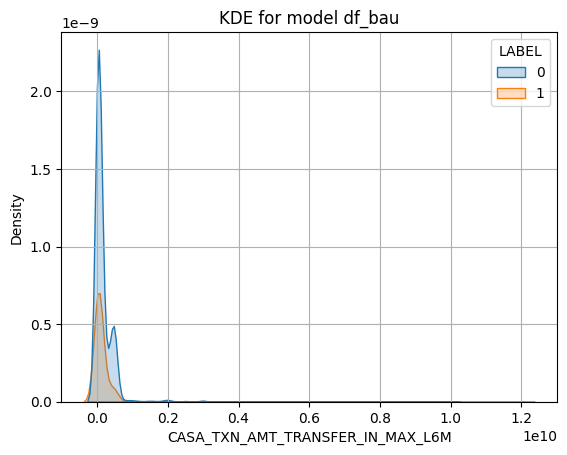

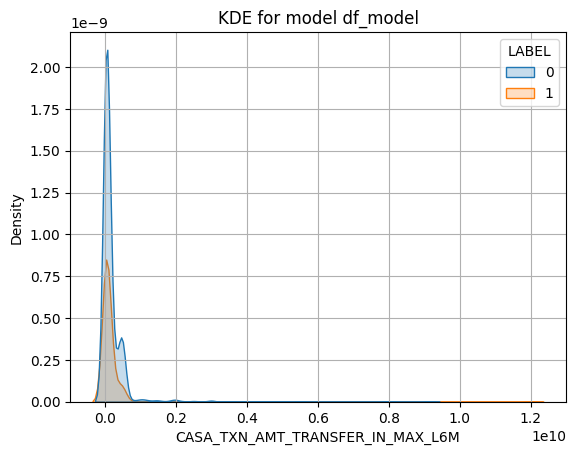

In [158]:
dataframes = [df_model_uni, df_bau, df_model]
labels = ['df_model_uni', 'df_bau', 'df_model']
for df,label in zip(dataframes, labels):
    sns.kdeplot(data=df, x='CASA_TXN_AMT_TRANSFER_IN_MAX_L6M',hue='LABEL', fill=True,)
    plt.grid(True)
    plt.title(f'KDE for model {label}')
    plt.show()

### LEAD PILOT SEP_2024

In [3]:
# load lead from DS
lead_gb_sep2024 = pd.read_excel(r'D:/AI_project/Tối ưu hoạt động Field/testing_lead_Sep2024/lead_testing_GB_202408.xlsx'
                                ,sheet_name='Sheet1',usecols=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15],engine='openpyxl',dtype={'CIF':str})
print(lead_gb_sep2024.shape)
lead_gb_sep2024.head()

(69251, 15)


,CIF,Ho Ten,Bucket Cif,Tổng dư nợ,Gốc,Lãi + Phạt,Số ngày quá hạn,Số lần tác nghiệp Field của User trong tháng,PTP,UNC,TPC,RPC,Intensity/month,Ranking,product_group
0,11337833,NGUYEN THI QUANG THANH,B00,2.333800e+09,2.333800e+09,0.0,0,1,0,1,0,0,0-2,0.963973,RB_Household Business
1,11433087,HOANG THI NGA,B00,4.500000e+09,4.500000e+09,0.0,0,1,0,0,0,1,0-2,0.963897,RB_Household Business
2,6157522,NGUYEN THI QUAN,B00,1.452684e+09,1.452684e+09,0.0,0,2,0,0,2,0,0-2,0.963892,RB_Consumption Loan
3,6157522,NGUYEN THI QUAN,B00,1.452684e+09,1.452684e+09,0.0,0,2,0,0,2,0,0-2,0.963892,RB_Household Business
4,6772683,TRAN VAN TINH,B00,4.547341e+08,4.547341e+08,0.0,0,0,0,0,0,0,0-1,0.963885,RB_Household Business


In [4]:
lead_gb_sep2024.CIF.nunique()

36488

In [5]:
lead_group = lead_gb_sep2024.groupby(['CIF']).agg(Proba=('Ranking','max')).reset_index()
print(lead_group.shape)
lead_group.head()

(36488, 2)


,CIF,Proba
0,10000073,0.952752
1,10000160,0.133868
2,10000230,0.961645
3,10000669,0.190973
4,10000671,0.045373


In [6]:
top_indices = lead_group['Proba'].nlargest(n=200).index
# lead_gb_sep2024['Flag_top_model'] = ''
top_200 = lead_group.loc[top_indices, 'CIF'].tolist()
top_200

['11337833',
 '11433087',
 '6157522',
 '6772683',
 '6941394',
 '10712157',
 '6513166',
 '8230007',
 '6382907',
 '8375250',
 '741897',
 '3852798',
 '11061640',
 '10270264',
 '1462464',
 '8239680',
 '6592201',
 '7018960',
 '11585707',
 '8139177',
 '8293071',
 '2265465',
 '11820714',
 '7263756',
 '13328218',
 '8188517',
 '843754',
 '8065971',
 '5851149',
 '4229789',
 '9413992',
 '14725989',
 '8039985',
 '3715088',
 '7476797',
 '6703765',
 '815052',
 '8055983',
 '5387842',
 '7621283',
 '3064922',
 '6885140',
 '6435416',
 '6496983',
 '6876590',
 '2769221',
 '5584828',
 '6415883',
 '6801060',
 '7014422',
 '1499211',
 '5975797',
 '6022364',
 '7321169',
 '7993207',
 '6502217',
 '2286655',
 '3247366',
 '7837236',
 '2222625',
 '7325800',
 '9338849',
 '3000575',
 '10607390',
 '6798373',
 '4222466',
 '7419185',
 '8133647',
 '10519044',
 '13040459',
 '1706945',
 '7132575',
 '8222861',
 '2066879',
 '927798',
 '1666998',
 '5874479',
 '4741122',
 '7314552',
 '10598525',
 '8280637',
 '5806585',
 '98890

In [7]:
# get data from DSPB
dspb = pd.read_sql(r"""select CUSTOMER_ID as CIF, PROVINCE_CITY as Province, CURRENT_DISTRICT as District, CURRENT_ADDRESS as Address
                   FROM KHCS..DSPB_202408""", con=conn_206, dtype={'CIF':str})
print(dspb.shape)
dspb.head()

(1026727, 4)


,CIF,Province,District,Address
0,5282413,HA NOI,Quận Nam Từ Liêm,"CĂN HỘ A1601, CHUNG CƯ ATHENA COMPLEX, TDP SỐ ..."
1,11127033,LONG AN,Thành phố Tân An,"136/7 HUỲNH HỮU THỐNG, KHU PHỐ BÌNH AN"
2,2057142,HO CHI MINH,Quận 5,99 7B phạm hữu chí phường 15
3,6714852,BAC NINH,Thành phố Bắc Ninh,Số 81 đường Thành Sơn Đáp Cầu
4,2354405,HA NOI,None,None


In [8]:
# merge address into lead GB
lead_gb_sep2024 = pd.merge(left=lead_gb_sep2024, left_on='CIF', right=dspb, right_on='CIF', how='left')
lead_gb_sep2024 = lead_gb_sep2024.drop_duplicates()
lead_gb_sep2024

,CIF,Ho Ten,Bucket Cif,Tổng dư nợ,Gốc,Lãi + Phạt,Số ngày quá hạn,Số lần tác nghiệp Field của User trong tháng,PTP,UNC,TPC,RPC,Intensity/month,Ranking,product_group,Province,District,Address
0,11337833,NGUYEN THI QUANG THANH,B00,2.333800e+09,2.333800e+09,0.00,0,1,0,1,0,0,0-2,0.963973,RB_Household Business,BAC NINH,Huyện Yên Phong,THÂN THƯỢNG
1,11433087,HOANG THI NGA,B00,4.500000e+09,4.500000e+09,0.00,0,1,0,0,0,1,0-2,0.963897,RB_Household Business,HA NOI,Quận Long Biên,P 820 P3 KĐT Việt Hưng
2,6157522,NGUYEN THI QUAN,B00,1.452684e+09,1.452684e+09,0.00,0,2,0,0,2,0,0-2,0.963892,RB_Consumption Loan,BAC GIANG,Huyện Lục Ngạn,"PHỐ KÉP, HỒNG GIANG"
4,6157522,NGUYEN THI QUAN,B00,1.452684e+09,1.452684e+09,0.00,0,2,0,0,2,0,0-2,0.963892,RB_Household Business,BAC GIANG,Huyện Lục Ngạn,"PHỐ KÉP, HỒNG GIANG"
6,6772683,TRAN VAN TINH,B00,4.547341e+08,4.547341e+08,0.00,0,0,0,0,0,0,0-1,0.963885,RB_Household Business,NGHE AN,Huyện Yên Thành,Phuc thanh
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138139,3890485,NGUYEN THANH PHONG,B02,2.385192e+08,1.988899e+08,39629258.00,59,6,0,0,1,0,4-6,0.036605,RB_Comm,TIEN GIANG,Huyện Chợ Gạo,Ấp Bình Khương I Bình Phục Nhứt Chợ Gạo Tỉnh T...
138140,7037330,TRAN THI VAN,B03,1.336992e+08,1.231266e+08,10572618.18,341,16,0,0,0,4,2-4,0.036394,RB_Credit Card,BAC NINH,None,None
138142,7037330,TRAN THI VAN,B03,1.336992e+08,1.231266e+08,10572618.18,341,16,0,0,0,4,2-4,0.036394,RB_Credit Card,BAC NINH,Huyện Quế Võ,"THON MAO DOC, PHUONG MAO, QUE VO, B AC NINH,PH..."
138144,7037330,TRAN THI VAN,B03,1.336992e+08,1.231266e+08,10572618.18,341,16,0,0,0,4,2-4,0.036394,RB_Unsecured Loan,BAC NINH,None,None


In [24]:
testing_data_gb = lead_gb_sep2024[lead_gb_sep2024['CIF'].isin(top_200)]
testing_data_gb = testing_data_gb.drop_duplicates()
testing_data_gb.to_excel(r'D:/AI_project/Tối ưu hoạt động Field/testing_lead_Sep2024/sub_lead_top200_GB.xlsx',index=False)
testing_data_gb.shape

(317, 18)

In [9]:
# province for all
province = lead_gb_sep2024.groupby(['Province']).agg(Count=('CIF','nunique'),Low=('Ranking','min')) \
            .reset_index().sort_values(by='Count', ascending=False)
province

,Province,Count,Low
22,HO CHI MINH,6089,0.036964
17,HA NOI,6012,0.037094
47,THANH HOA,1175,0.038272
13,DONG NAI,974,0.036763
6,BINH DUONG,965,0.036919
3,BAC NINH,942,0.036394
20,HAI PHONG,939,0.036691
1,BAC GIANG,871,0.038915
11,DA NANG,744,0.039782
31,NAM DINH,660,0.039623


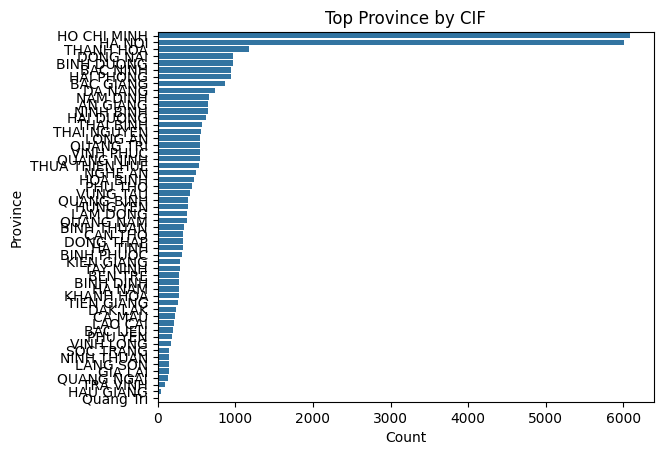

<Figure size 2100x1500 with 0 Axes>

In [18]:
sns.barplot(data=province,x='Count',y='Province')
plt.title('Top Province by CIF')
plt.figure(figsize=(21, 15))
plt.tight_layout()
plt.show()

In [19]:
intensity = lead_gb_sep2024.groupby(['Intensity/month']).agg(Count=('CIF','nunique')).reset_index().sort_values(by='Count',ascending=False)
intensity

,Intensity/month,Count
1,0-2,19594
2,1-3,6120
0,0-1,3847
3,2-4,3310
4,3-5,1574
5,4-6,905
6,5-7,543
7,6-8,325
8,7-9,198
9,>=9,72


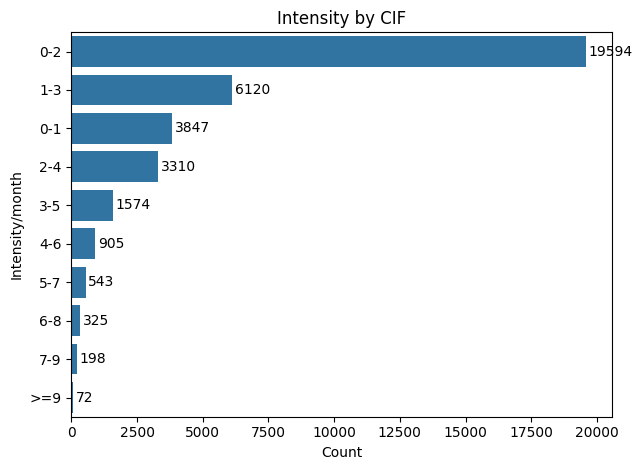

In [24]:
ax = sns.barplot(intensity,x='Count',y='Intensity/month')
plt.title('Intensity by CIF')
plt.tight_layout()
for p in ax.patches:
    width = p.get_width()  # Lấy chiều rộng của từng cột
    ax.text(width + 100,  # Vị trí x của giá trị (cộng thêm khoảng cách)
            p.get_y() + p.get_height() / 2,  # Vị trí y của giá trị (giữa cột)
            f'{int(width)}',  # Giá trị để hiển thị
            ha='left',  # Căn chỉnh giá trị
            va='center')  # Căn chỉnh giá trị theo chiều dọc
plt.show()

### EDA map CBTHN

In [2]:
# load result from model
model = pd.read_excel(r'D:/AI_project/Tối ưu hoạt động Field/testing_lead_Sep2024/lead_th8_BB_RCC.xlsx',engine='openpyxl',usecols=[1,2,3,4,5,6,7,8,9,10],dtype={'cif':str})
model

,ref_month,cif,respbl,repayment,repay_rate,SCORE,"LABEL (có trả tiền, >= 500k)",action_date,setA_real_approach,setC_model_recommended
0,202407,6853360,2.718727e+08,8,2.942554e-08,0.997222,0,2024-08-01,1,1
1,202407,5840804,5.610847e+07,0,0.000000e+00,0.996835,0,2024-08-08,1,1
2,202407,10232825,4.204637e+08,9850390,2.342745e-02,0.996725,1,NaT,0,1
3,202407,5780920,1.593852e+08,1771134,1.111228e-02,0.996632,1,2024-08-20,1,1
4,202407,12170140,1.093516e+08,2,1.828963e-08,0.996597,0,NaT,0,1
...,...,...,...,...,...,...,...,...,...,...
100932,202407,9084666,5.911137e+07,0,0.000000e+00,0.012564,0,NaT,0,0
100933,202407,9668634,3.615431e+08,0,0.000000e+00,0.012562,0,NaT,0,0
100934,202407,9600988,3.146747e+08,0,0.000000e+00,0.012558,0,NaT,0,0
100935,202407,9623590,6.163271e+07,0,0.000000e+00,0.012552,0,2024-08-14,1,0


In [3]:
# get data Phong / CBTHN from DSPB
dspb = pd.read_excel(r'D:/AI_project/Tối ưu hoạt động Field/Field HCM NM_202408 (chốt)_DSPB Field.xlsx',engine='openpyxl',usecols=[3,18,19,20],dtype={'CUSTOMER_ID':str})
dspb

,CUSTOMER_ID,PHONG_T,BO_PHAN_T,CVXLN_T
0,10000011,FIELD HCM NM,dangth12,tuannq24
1,10000011,FIELD HCM NM,dangth12,tuannq24
2,10000335,FIELD HCM NM,tanqt,hungnt69
3,10000335,FIELD HCM NM,tanqt,hungnt69
4,1000057,FIELD HCM NM,tanqt,tangvv
...,...,...,...,...
36442,9998759,FIELD HCM NM,phuongth8,tungvs3
36443,9998778,FIELD HCM NM,viethq12,VUTK1
36444,9999190,FIELD HCM NM,thanhhlt,nomn
36445,9999342,FIELD HCM NM,Viethq12,LILNV


In [4]:
# map Phong into model
df = pd.merge(left=model, left_on='cif', right=dspb, right_on='CUSTOMER_ID', how='left')
print(df.shape)
df.head()

(114121, 14)


,ref_month,cif,respbl,repayment,repay_rate,SCORE,"LABEL (có trả tiền, >= 500k)",action_date,setA_real_approach,setC_model_recommended,CUSTOMER_ID,PHONG_T,BO_PHAN_T,CVXLN_T
0,202407,6853360,2.718727e+08,8,2.942554e-08,0.997222,0,2024-08-01,1,1,NaN,NaN,NaN,NaN
1,202407,5840804,5.610847e+07,0,0.000000e+00,0.996835,0,2024-08-08,1,1,NaN,NaN,NaN,NaN
2,202407,10232825,4.204637e+08,9850390,2.342745e-02,0.996725,1,NaT,0,1,NaN,NaN,NaN,NaN
3,202407,5780920,1.593852e+08,1771134,1.111228e-02,0.996632,1,2024-08-20,1,1,NaN,NaN,NaN,NaN
4,202407,12170140,1.093516e+08,2,1.828963e-08,0.996597,0,NaT,0,1,NaN,NaN,NaN,NaN


In [6]:
df = df.drop(columns=['CUSTOMER_ID'])

In [9]:
# dataset only model add-on
model_only = df[(df['setA_real_approach']==0) & (df['setC_model_recommended']==1)]
model_only

,ref_month,cif,respbl,repayment,repay_rate,SCORE,"LABEL (có trả tiền, >= 500k)",action_date,setA_real_approach,setC_model_recommended,PHONG_T,BO_PHAN_T,CVXLN_T
2,202407,10232825,4.204637e+08,9850390,2.342745e-02,0.996725,1,NaT,0,1,NaN,NaN,NaN
4,202407,12170140,1.093516e+08,2,1.828963e-08,0.996597,0,NaT,0,1,NaN,NaN,NaN
7,202407,3052590,1.537162e+08,1000000,6.505496e-03,0.996349,1,NaT,0,1,NaN,NaN,NaN
8,202407,4150384,4.512596e+07,2400004,5.318455e-02,0.996331,1,NaT,0,1,NaN,NaN,NaN
9,202407,6400850,4.376237e+07,2252002,5.145978e-02,0.996317,1,NaT,0,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42471,202407,4070527,4.588614e+07,0,0.000000e+00,0.014536,0,NaT,0,1,NaN,NaN,NaN
42472,202407,6103309,4.443148e+07,0,0.000000e+00,0.014536,0,NaT,0,1,NaN,NaN,NaN
42473,202407,8093954,5.062330e+07,0,0.000000e+00,0.014536,0,NaT,0,1,NaN,NaN,NaN
42474,202407,9394292,3.108677e+07,0,0.000000e+00,0.014535,0,NaT,0,1,FIELD HCM NM,manhnv14,kientt24


In [11]:
model_only['BO_PHAN_T'].value_counts()

BO_PHAN_T
tanqt        651
phuongth8    637
thanhhlt     612
duynk7       583
manhnv14     372
dangth12     327
viethq12     282
locnt14      271
phungth2     105
LOCNT14       62
trungct       45
Viethq12      36
DANGTH12      13
Name: count, dtype: int64

In [12]:
# dataset both model and real going
both = df[(df['setA_real_approach']==1) & (df['setC_model_recommended']==1)]
both

,ref_month,cif,respbl,repayment,repay_rate,SCORE,"LABEL (có trả tiền, >= 500k)",action_date,setA_real_approach,setC_model_recommended,PHONG_T,BO_PHAN_T,CVXLN_T
0,202407,6853360,2.718727e+08,8,2.942554e-08,0.997222,0,2024-08-01,1,1,NaN,NaN,NaN
1,202407,5840804,5.610847e+07,0,0.000000e+00,0.996835,0,2024-08-08,1,1,NaN,NaN,NaN
3,202407,5780920,1.593852e+08,1771134,1.111228e-02,0.996632,1,2024-08-20,1,1,NaN,NaN,NaN
5,202407,10432398,2.306167e+08,27000023,1.170775e-01,0.996501,1,2024-08-19,1,1,NaN,NaN,NaN
6,202407,4584685,6.537083e+07,4110001,6.287209e-02,0.996449,1,2024-08-01,1,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42467,202407,2730684,2.672073e+08,0,0.000000e+00,0.014536,0,2024-08-07,1,1,FIELD HCM NM,phuongth8,tungvs3
42468,202407,2730684,2.672073e+08,0,0.000000e+00,0.014536,0,2024-08-07,1,1,FIELD HCM NM,phuongth8,tungvs3
42470,202407,6513325,3.805938e+07,0,0.000000e+00,0.014536,0,2024-08-07,1,1,FIELD HCM NM,dangth12,QUANGDP
42475,202407,6380174,9.962562e+07,0,0.000000e+00,0.014535,0,2024-08-17,1,1,NaN,NaN,NaN


In [13]:
both['BO_PHAN_T'].value_counts()

BO_PHAN_T
thanhhlt     1311
viethq12      911
dangth12      794
phuongth8     739
tanqt         633
duynk7        537
manhnv14      506
locnt14       392
trungct       351
phungth2      169
Viethq12       62
LOCNT14        16
DANGTH12       16
Name: count, dtype: int64

In [17]:
# tim xem phong nao di hieu qua nhat
check = both[['LABEL (có trả tiền, >= 500k)','cif','BO_PHAN_T']].drop_duplicates()
check.groupby(['LABEL (có trả tiền, >= 500k)','BO_PHAN_T'])['cif'].size().reset_index().sort_values(by=['LABEL (có trả tiền, >= 500k)','cif'],ascending=False)

,"LABEL (có trả tiền, >= 500k)",BO_PHAN_T,cif
21,1,thanhhlt,107
14,1,dangth12,55
19,1,phuongth8,50
23,1,viethq12,48
17,1,manhnv14,30
15,1,duynk7,25
16,1,locnt14,23
20,1,tanqt,20
22,1,trungct,19
18,1,phungth2,5


### CHECK MODEL RESULT

In [ ]:
# load dataset:
dfs = []
for ref_month in ['202307','202308','202309','202310','202311','202312','202401','202402','202403','202404','202405','202406']:
    folder_path = f'D:/AI_project/Khởi kiện sớm GB SEC/backtest/dataset_collection_full/REF_MONTH={ref_month}'

    for filename in os.listdir(folder_path):
        if filename.endswith('.parquet'):
            file_path = os.path.join(folder_path, filename)
            df = pd.read_parquet(file_path, engine='pyarrow')
            df['REF_MONTH'] = ref_month
            dfs.append(df)
        
    # Gộp tất cả các DataFrame thành một DataFrame duy nhất
    dataset = pd.concat(dfs, ignore_index=True)

df_full = pd.concat(dataset, ignore_index=True)
print(df_full.shape)
df_full.head()

In [2]:
# take only dataset on 6/2024 for verify
dfs = []
folder_path = f'D:/AI_project/Khởi kiện sớm GB SEC/backtest/dataset_collection_full/REF_MONTH=202406'
for filename in os.listdir(folder_path):
        if filename.endswith('.parquet'):
            file_path = os.path.join(folder_path, filename)
            df = pd.read_parquet(file_path, engine='pyarrow')
            df['REF_MONTH'] = '202406'
            dfs.append(df)
dataset = pd.concat(dfs, ignore_index=True)
dataset

CIF LABEL_MONTH  LABEL_DPD10_1M  LABEL_DPD30  LABEL_DPD30_1M  \
0        6492860      202408             0.0          0.0             0.0   
1       10000297      202408             0.0          0.0             0.0   
2        6494207      202408             0.0          0.0             0.0   
3       10001812      202408             0.0          0.0             0.0   
4        6495583      202408             0.0          0.0             0.0   
...          ...         ...             ...          ...             ...   
142852   9958594      202408             0.0          0.0             0.0   
142853   9969512      202408             0.0          0.0             0.0   
142854   9981454      202408             1.0          1.0             0.0   
142855   9982937      202408             0.0          0.0             0.0   
142856   9999925      202408             0.0          0.0             0.0   

        LABEL_DPD60 BOM_BUCKET BOM_BUCKET_GROUP EOM_BUCKET BOM_BUCKET_CIF  \
0               0.0        B00              B00        B00            B00   
1               0.0        B00              B00        B00            B00   
2               0.0        B00              B00        B00            B00   
3               0.0        B00              B00        B00            B00   
4               0.0        B00              B00        B00            B00   
...             ...        ...              ...        ...            ...   
142852          0.0        B00              B00        B00            B00   
142853          0.0        B00              B00        B00            B00   
142854          0.0        B01              B01        B00            B01   
142855          0.0        B00              B00        B00            B00   
142856          0.0        B00              B00        B00            B00   

       BOM_BUCKET_CIF_GROUP EOM_BUCKET_CIF BUCKET_FINAL BUCKET_SME_COC  \
0                       B00            B00          B00           B01+   
1                       B00            B00          B00           B01+   
2                       B00            B00          B00           B01+   
3                       B00            B00          B00           B01+   
4                       B00            B00          B00           B01+   
...                     ...            ...          ...            ...   
142852                  B00            B00          B00           B01+   
142853                  B00            B00          B00           B01+   
142854                  B01            B00          B01           B01+   
142855                  B00            B00          B00           B01+   
142856                  B00            B00          B00           B01+   

       NEWRB_BUCKET_GROUP  RST  RPC_LM  UNIQUE_RPC_OTHER  RESOLVE_LM  \
0                     B00  NaN     0.0               0.0         1.0   
1                     B00  NaN     0.0               0.0         1.0   
2               B01 daily  NaN     1.0               0.0         1.0   
3                     B00  NaN     1.0               0.0         1.0   
4                     B00  NaN     0.0               0.0         1.0   
...                   ...  ...     ...               ...         ...   
142852                B00  NaN     0.0               0.0         1.0   
142853                B00  NaN     0.0               0.0         1.0   
142854          B01 daily  NaN     1.0               0.0         1.0   
142855                B00  NaN     0.0               0.0         1.0   
142856                B00  NaN     0.0               0.0         1.0   

        FLAG_NEW_UNIQUE_ACTION  FLAG_IVM_NORMAL  FLAG_IVM_INTERACTIVE  \
0                          NaN              NaN                   NaN   
1                          NaN              NaN                   NaN   
2                          1.0              NaN                   NaN   
3                          NaN              NaN                   NaN   
4                          NaN              

In [10]:
dataset['CIF'].nunique()

142857

In [3]:
check = dataset[['CIF','LABEL_MONTH','REF_MONTH','LABEL_DPD10_1M','LABEL_DPD30','LABEL_DPD30_1M','LABEL_DPD60','TOTAL_PRINCIPLE_CURR','UNRESOLVE_AMT_CIF','RESOLVE_AMT_CIF','TOD_DPD']]
check

,CIF,LABEL_MONTH,REF_MONTH,LABEL_DPD10_1M,LABEL_DPD30,LABEL_DPD30_1M,LABEL_DPD60,TOTAL_PRINCIPLE_CURR,UNRESOLVE_AMT_CIF,RESOLVE_AMT_CIF,TOD_DPD
0,6492860,202408,202406,0.0,0.0,0.0,0.0,1.900000e+08,0.0,192500000.0,0.0
1,10000297,202408,202406,0.0,0.0,0.0,0.0,2.386840e+08,0.0,245232000.0,0.0
2,6494207,202408,202406,0.0,0.0,0.0,0.0,5.937249e+07,0.0,34634000.7,0.0
3,10001812,202408,202406,0.0,0.0,0.0,0.0,2.245833e+08,0.0,224583338.0,0.0
4,6495583,202408,202406,0.0,0.0,0.0,0.0,5.741760e+08,0.0,579592000.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
142852,9958594,202408,202406,0.0,0.0,0.0,0.0,3.368050e+08,0.0,344640000.0,0.0
142853,9969512,202408,202406,0.0,0.0,0.0,0.0,3.000000e+08,0.0,300000000.0,0.0
142854,9981454,202408,202406,1.0,1.0,0.0,0.0,4.054360e+08,0.0,415832000.0,0.0
142855,9982937,202408,202406,0.0,0.0,0.0,0.0,3.419800e+08,0.0,346370000.0,0.0


In [5]:
# check.to_csv('data_set_202406.csv',index=False)

In [4]:
# read result backtest
df = pd.read_parquet(r"D:/AI_project/Khởi kiện sớm GB SEC/backtest/result_tbkk_202406.parquet")

# read result KKS backtest
df2 = pd.read_parquet(r"D:/AI_project/Khởi kiện sớm GB SEC/backtest/result_kks_202406.parquet")
df2

,CIF,FLAG_DPD60
0,10016564,RED
1,10031876,RED
2,10038914,RED
3,10092841,RED
4,10116390,RED
...,...,...
6154,9636685,YELLOW
6155,9658697,YELLOW
6156,9689460,RED
6157,9885573,RED


In [3]:
df['FLAG_DPD30'].unique()

array(['RED', 'YELLOW', 'GREEN'], dtype=object)

In [8]:
subset = pd.merge(left=check,right=df,on='CIF',how='left')
subset

,CIF,LABEL_MONTH,REF_MONTH,LABEL_DPD10_1M,LABEL_DPD30,LABEL_DPD30_1M,LABEL_DPD60,TOTAL_PRINCIPLE_CURR,UNRESOLVE_AMT_CIF,RESOLVE_AMT_CIF,TOD_DPD,FLAG_DPD30
0,6492860,202408,202406,0.0,0.0,0.0,0.0,1.900000e+08,0.0,192500000.0,0.0,RED
1,10000297,202408,202406,0.0,0.0,0.0,0.0,2.386840e+08,0.0,245232000.0,0.0,RED
2,6494207,202408,202406,0.0,0.0,0.0,0.0,5.937249e+07,0.0,34634000.7,0.0,RED
3,10001812,202408,202406,0.0,0.0,0.0,0.0,2.245833e+08,0.0,224583338.0,0.0,RED
4,6495583,202408,202406,0.0,0.0,0.0,0.0,5.741760e+08,0.0,579592000.0,0.0,RED
...,...,...,...,...,...,...,...,...,...,...,...,...
142852,9958594,202408,202406,0.0,0.0,0.0,0.0,3.368050e+08,0.0,344640000.0,0.0,RED
142853,9969512,202408,202406,0.0,0.0,0.0,0.0,3.000000e+08,0.0,300000000.0,0.0,RED
142854,9981454,202408,202406,1.0,1.0,0.0,0.0,4.054360e+08,0.0,415832000.0,0.0,RED
142855,9982937,202408,202406,0.0,0.0,0.0,0.0,3.419800e+08,0.0,346370000.0,0.0,RED


In [9]:
subset['FLAG_DPD30'].value_counts(dropna=False)

FLAG_DPD30
RED       110427
YELLOW     14172
NaN         9555
GREEN       8703
Name: count, dtype: int64

In [18]:
test = subset[~subset['FLAG_DPD30'].isnull()]
test[['TOD_DPD']].sort_values(by='TOD_DPD',ascending=True)

,TOD_DPD
0,0.0
95171,0.0
95170,0.0
95169,0.0
95168,0.0
...,...
16287,9.0
44408,9.0
67431,9.0
68060,9.0


In [9]:
# loai cac CIF co TOD_DPD >= 10
subset = subset.dropna(subset=['FLAG_DPD30'])
subset.shape

(133302, 12)

In [5]:
# read raw db
dfs = []
path = r'D:/AI_project/Khởi kiện sớm GB SEC/backtest/REF_MONTH=202406_raw_db'
for filename in os.listdir(path):
        if filename.endswith('.parquet'):
            file_path = os.path.join(path, filename)
            df = pd.read_parquet(file_path, engine='pyarrow')
            df['REF_MONTH'] = '202406'
            dfs.append(df)
data = pd.concat(dfs, ignore_index=True)
data

,REF_DATE,CIF,CONTRACT_NO,CONTRACT_NO_NEW,NO_OVD_DAYS,DUE_DATE,PRODUCT_NAME,PRODUCT_GROUP,TOTAL_EXPOSURE,REGION_DEFINATION,ZONE_RETAIL,TEAM_COLLECTION,RISK_LEVEL,GPTC,TOTAL_PRINCIPLE,BOM_BUCKET,FLAG_TIMO,BIC_PRODUCT_GROUP,BOM_BUCKET_GROUP,TOD_DPD,TOTAL_PRINCIPLE_CURR,OVD_AMT_CURR,TOTAL_EXPOSURE_CURR,EOM_DPD,EOM_BUCKET,PAID_OFF,RESOLVE,UNRESOLVE,RESOLVE_AMT,UNRESOLVE_AMT,TARGET_OVERALL_AMT,TARGET_BY_PRODUCT,CCN_COVID,MI_REPORT,MIN_DUE_DATE_CIF,DUE,DUE_CIF,BOM_BUCKET_CIF,BOM_BUCKET_CIF_GROUP,EOM_BUCKET_CIF,RESOLVE_CIF,UNRESOLVE_CIF,RESOLVE_AMT_CIF,UNRESOLVE_AMT_CIF,WC_REVOLVING,SECURED_TYPE,BOM_BAL_CIF,BIG_CASE_SME,MATDT,TICKET_SIZE,BI_CHANNEL,DBS_CHANNEL,BI_PROJECT,BI_REGION,MIN_DUE_DATE,MAX_DUE_DATE_CIF,MAX_OVD,DUE_DATE_FINAL,BUCKET_FINAL,FLAG_COVERAGE,PRODUCT_MERGE,PHONG,BUCKET_SME_COC,REGION_COC,FLAG_IVM_FINAL,IVM,TOTAL_TRIAL_CALL_IVM,TOTAL_TRIAL_CALL_AD,TOTAL_TRIAL_CALL_MANUAL,TOTAL_TRIAL_CALL_PREDICT,TOTAL_TRIAL_CALL_PRI,TOTAL_TRIAL_CALL_REF,TOTAL_TRIAL_CALL,TOTAL_TRIAL_CALL_NON_IVM,TOTAL_TRIAL_CALL_NON_IVM_PRI,TOTAL_TRIAL_CALL_NON_IVM_REF,TOTAL_TRIAL_CALL_IVM_5S,TOTAL_TRIAL_CALL_AD_5S,TOTAL_TRIAL_CALL_MANUAL_5S,TOTAL_TRIAL_CALL_PREDICT_5S,TOTAL_TRIAL_CALL_5S,TOTAL_TRIAL_CALL_NON_IVM_5S,TOTAL_TRIAL_CALL_NON_IVM_PRI_5S,TOTAL_TRIAL_CALL_NON_IVM_REF_5S,TOTAL_CONTACT_FIELD,TOTAL_CONTACT_ACTION,TOTAL_TRIAL_ACTION,TOTAL_TRIAL_CALL_ACTION,TOTAL_TRIAL_FIELD,TOTAL_TRIAL_FIELD_RCC,TOTAL_TRIAL_FIELD_BU,TOTAL_RPC_CALL,TOTAL_RPC_FIELD,TOTAL_TPC_CALL,TOTAL_TPC_FIELD,TOTAL_UNC_CALL,TOTAL_UNC_FIELD,TOTAL_RPC_ACTION,TOTAL_TPC_ACTION,TOTAL_PTP_CALL,TOTAL_PTP_FIELD,TOTAL_PTP_ACTION,KPTP_CALL,KPTP_FIELD,KPTP,BPTP,TOTAL_REFUSE_ACTION,UNIQUE_TRIAL_CALL_IVM,UNIQUE_TRIAL_CALL_AD,UNIQUE_TRIAL_CALL_MANUAL,UNIQUE_TRIAL_CALL_PREDICT,UNIQUE_TRIAL_CALL,UNIQUE_TRIAL_CALL_NON_IVM,UNIQUE_CONTACT_FIELD,UNIQUE_CONTACT_ACTION,UNIQUE_TRIAL_ACTION,UNIQUE_TRIAL_CALL_ACTION,UNIQUE_TRIAL_FIELD,UNIQUE_TRIAL_FIELD_RCC,UNIQUE_TRIAL_FIELD_BU,UNIQUE_RPC_CALL,UNIQUE_RPC_FIELD,UNIQUE_TPC_CALL,UNIQUE_TPC_FIELD,UNIQUE_UNC_CALL,UNIQUE_UNC_FIELD,UNIQUE_RPC_ACTION,UNIQUE_TPC_ACTION,UNIQUE_PTP_CALL,UNIQUE_PTP_FIELD,UNIQUE_PTP_ACTION,UNIQUE_ACTION,UNIQUE_UNC_ACTION,UNIQUE_KPTP_CALL,UNIQUE_KPTP_FIELD,UNIQUE_KPTP_ACTION,UNIQUE_BPTP,UNIQUE_REFUSE_ACTION,RESOLVE_FINAL,PTP_DUR,TOTAL_TRIAL_CALL_IVM_CIF,TOTAL_TRIAL_CALL_AD_CIF,TOTAL_TRIAL_CALL_MANUAL_CIF,TOTAL_TRIAL_CALL_PREDICT_CIF,TOTAL_TRIAL_CALL_CIF,TOTAL_TRIAL_CALL_5S_CIF,TOTAL_TRIAL_FIELD_CIF,TOTAL_TRIAL_ACTION_CIF,TOTAL_TRIAL_CALL_ACTION_CIF,UNIQUE_TRIAL_CALL_CIF,UNIQUE_TRIAL_CALL_5S_CIF,UNIQUE_TRIAL_FIELD_CIF,UNIQUE_TRIAL_ACTION_CIF,UNIQUE_ACTION_CIF,UNIQUE_RPC_ACTION_CIF,UNIQUE_TPC_ACTION_CIF,UNIQUE_UNC_ACTION_CIF,UNIQUE_PTP_ACTION_CIF,UNIQUE_KPTP_ACTION_CIF,UNIQUE_BPTP_ACTION_CIF,FLAG_IVM_TRANSFER,FLAG_IVM_INTERACTIVE,FLAG_IVM_NORMAL,FLAG_NEW_UNIQUE_ACTION,TOTAL_TRIAL_CALL_IVR_TRANSFER,TOTAL_TRIAL_CALL_IVR,TOTAL_TRIAL_CALL_IVM_NORMAL,UNIQUE_RPC_OTHER,FLAG_UNIQUE_ACTION_CALL,RPC_LM,RESOLVE_LM,RST,FLAG_HIGHRISK,TOTAL_TRIAL_CALL_CALLBOT,TOTAL_TRIAL_CALL_CALLBOT_5S,UNIQUE_TRIAL_CALL_CALLBOT,TYPE_RPC_ACTION,NEWRB_BUCKET_GROUP,REF_MONTH
0,2024-06-30,179941,151-P-779919,151-P-779919,0.0,2024-06-04,MC StepUp Credit,RB_Credit Card,1.528899e+06,HA NOI,VUNG 1B,CREDIT CARD,GREEN,None,9.800000e+05,B00,NaN,RB_Credit Card,B00,NaN,0.000000e+00,0.0,4.949410e+03,NaN,B00,0,1,0,9.800000e+05,0.0,1.737955e+04,0.017734,NO,NaN,2024-06-04,DUE,DUE_CIF,B00,B00,B00,1,0,9.800000e+05,0.0,N,None,NaN,None,None,NO,VPBANK AU CO,None,Normal branch,VUNG 1B,2024-06-04,2024-06-04,NaN,2024-06-04,B00,NO,UNSECURED,SOFT_CALL,B01+,HA NOI,NOT IVM,NOT IVM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,

In [6]:
# get principle for CIF
prin = data.groupby(by=['CIF']).agg(
    TotalPrinciple=('TOTAL_PRINCIPLE_CURR','sum'),
    ResolveAmt=('RESOLVE_AMT','sum'),
    UnresolveAmt=('UNRESOLVE_AMT','sum')
    ).reset_index()
print(prin.shape)
prin.head(3)

(1157250, 4)


,CIF,TotalPrinciple,ResolveAmt,UnresolveAmt
0,001082052173,5.920817e+07,5.919827e+07,0.0
1,001184005565,1.579918e+08,1.579918e+08,0.0
2,014176000030,3.703704e+06,1.717187e+06,0.0


In [16]:
# map principle into subset
subset = subset.drop(columns=['TOTAL_PRINCIPLE_CURR','UNRESOLVE_AMT_CIF','RESOLVE_AMT_CIF'])
subset = pd.merge(left=subset, left_on='CIF', right=prin, right_on='CIF', how='left')
subset

,CIF,LABEL_MONTH,REF_MONTH,LABEL_DPD10_1M,LABEL_DPD30,LABEL_DPD30_1M,LABEL_DPD60,TOD_DPD,FLAG_DPD30,TotalPrinciple,ResolveAmt,UnresolveAmt
0,6492860,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,1.900000e+08,1.925000e+08,0.0
1,10000297,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,2.526608e+08,2.579175e+08,0.0
2,6494207,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,6.491249e+07,4.400400e+07,0.0
3,10001812,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,2.245833e+08,2.245833e+08,0.0
4,6495583,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,1.094221e+09,1.105311e+09,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
133297,9958594,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,3.368050e+08,3.446400e+08,0.0
133298,9969512,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,3.117234e+08,3.120742e+08,0.0
133299,9981454,202408,202406,1.0,1.0,0.0,0.0,0.0,RED,4.490411e+08,4.628696e+08,0.0
133300,9982937,202408,202406,0.0,0.0,0.0,0.0,0.0,RED,3.419800e+08,3.463700e+08,0.0


In [17]:
subset.to_excel('checking_KKS.xlsx',sheet_name='data_model',index=False)

In [25]:
subset['TOD_DPD'].value_counts(dropna=False).reset_index().sort_values(by='TOD_DPD', ascending=True)

,TOD_DPD,count
0,0.0,132861
8,1.0,2
4,2.0,44
3,3.0,44
5,4.0,23
2,5.0,115
1,6.0,179
6,7.0,21
7,9.0,13


In [26]:
subset['LABEL_DPD30'].value_counts()

LABEL_DPD30
0.0    131608
1.0      1694
Name: count, dtype: int64

In [7]:
# merge FLAG DPD 60
check2 = pd.merge(left=check, left_on='CIF', right=df2, right_on='CIF', how='left')
check2

,CIF,LABEL_MONTH,REF_MONTH,LABEL_DPD10_1M,LABEL_DPD30,LABEL_DPD30_1M,LABEL_DPD60,TOTAL_PRINCIPLE_CURR,UNRESOLVE_AMT_CIF,RESOLVE_AMT_CIF,TOD_DPD,FLAG_DPD60
0,6492860,202408,202406,0.0,0.0,0.0,0.0,1.900000e+08,0.0,192500000.0,0.0,NaN
1,10000297,202408,202406,0.0,0.0,0.0,0.0,2.386840e+08,0.0,245232000.0,0.0,NaN
2,6494207,202408,202406,0.0,0.0,0.0,0.0,5.937249e+07,0.0,34634000.7,0.0,NaN
3,10001812,202408,202406,0.0,0.0,0.0,0.0,2.245833e+08,0.0,224583338.0,0.0,NaN
4,6495583,202408,202406,0.0,0.0,0.0,0.0,5.741760e+08,0.0,579592000.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
142852,9958594,202408,202406,0.0,0.0,0.0,0.0,3.368050e+08,0.0,344640000.0,0.0,NaN
142853,9969512,202408,202406,0.0,0.0,0.0,0.0,3.000000e+08,0.0,300000000.0,0.0,NaN
142854,9981454,202408,202406,1.0,1.0,0.0,0.0,4.054360e+08,0.0,415832000.0,0.0,NaN
142855,9982937,202408,202406,0.0,0.0,0.0,0.0,3.419800e+08,0.0,346370000.0,0.0,NaN


In [9]:
# get principle
check2 = check2.drop(columns=['TOTAL_PRINCIPLE_CURR','UNRESOLVE_AMT_CIF','RESOLVE_AMT_CIF'])
subset2 = pd.merge(left=check2, left_on='CIF', right=prin, right_on='CIF', how='left')
subset2

,CIF,LABEL_MONTH,REF_MONTH,LABEL_DPD10_1M,LABEL_DPD30,LABEL_DPD30_1M,LABEL_DPD60,TOD_DPD,FLAG_DPD60,TotalPrinciple,ResolveAmt,UnresolveAmt
0,6492860,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,1.900000e+08,1.925000e+08,0.0
1,10000297,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,2.526608e+08,2.579175e+08,0.0
2,6494207,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,6.491249e+07,4.400400e+07,0.0
3,10001812,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,2.245833e+08,2.245833e+08,0.0
4,6495583,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,1.094221e+09,1.105311e+09,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
142852,9958594,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,3.368050e+08,3.446400e+08,0.0
142853,9969512,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,3.117234e+08,3.120742e+08,0.0
142854,9981454,202408,202406,1.0,1.0,0.0,0.0,0.0,NaN,4.490411e+08,4.628696e+08,0.0
142855,9982937,202408,202406,0.0,0.0,0.0,0.0,0.0,NaN,3.419800e+08,3.463700e+08,0.0


In [12]:
subset2[(subset2['TOD_DPD']>=1) & (subset2['TOD_DPD']<30)].to_excel('checking_KKS.xlsx',sheet_name='data_KKS',index=False)

In [ ]:
subset2.plot()